# Imports

In [5]:
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
import proplot as pplt
import xarray as xr
import pandas as pd
import os
#import aostools
import sys
import jinja2
import dataclasses
import metpy.calc
import datetime
from eofs.xarray import Eof
#import hvplot.xarray
print(sys.path)

import pytropd.functions as tropdf
import pytropd.metrics as tropdm
import aostools.climate

from own_functions import (vertical_weights, weights, horizontal_weights, calc_jet_lats, calc_jet_lats_tropd,
    calc_theta, eof_analysis, concat_hems_in_time_xr, calc_u_eofs, calc_avg_btw_hemispheres, calc_jet_sep_index,
    get_setup_from, get_ty_from, get_tmax_from, get_fgamma_from, calc_baroclinic_slope, zero_crossings, calc_da_derivative,
    calc_stream_function_xr
)
from own_functions import r_air, kappa, kappai, g0, p00, r_e, cp

from visualization import (plot_zm_climatologies, plot_transports, plot_hor_fields, 
    plot_ep_flux_div, plot_EKE_spectral, plot_spectral_vd, plot_hayashi_spectra,
    plot_wave_persistency, plot_theta_profiles, plot_t_profiles, plot_transports,
    plot_theta_u_zm_clim, plot_bc_slope_u_zm_clim, plot_dtdz_clim)
from relax_visualization import (Params_HS_PK, Forcing_params, 
    g_func, tteh_cc_tropics, tteh_waves, tteh_mons, relax_submodel, relax_moist_adiabat
)
import dataclasses
from dataclasses import dataclass

import warnings
warnings.simplefilter(action='ignore')

pplt.rc.update({
    'figure.dpi': 100,
    'figure.figsize': (8,6),
    'savefig.dpi': 150,
})

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
['/home/b/b381739/masterarbeit', '/home/b/b381739/masterarbeit', '/home/b/b381739/code', '/sw/spack-levante/mambaforge-4.11.0-0-Linux-x86_64-sobz6z/lib/python39.zip', '/sw/spack-levante/mambaforge-4.11.0-0-Linux-x86_64-sobz6z/lib/python3.9', '/sw/spack-levante/mambaforge-4.11.0-0-Linux-x86_64-sobz6z/lib/python3.9/lib-dynload', '', '/home/b/b381739/.local/lib/python3.9/site-packages', '/sw/spack-levante/mambaforge-4.11.0-0-Linux-x86_64-sobz6z/lib/python3.9/site-packages', '/project/meteo/work/Pablo.Conrat/code/']


# Setup

In [20]:
#exp_name = 'T90f060-090-01'
#exp_name = 'EMIL_SW_spinup'
#exp_name = 'T90f060-090-01'
#exp_name = 'transf060start'
exp_name =  'EMIL_SW90_f080'

ref_name = 'EMIL_SW90_f070'
#ref_name = 'noncnSW90_f090'
#ref_name =   'T90f090-060-01'
#ref_name = 'transf090start'

ylims=[1013,10]
yscale='linear'
plot_format = 'png'

rho_0 = 1.225
n = 1.2e-2 # Brunt-Väisälä frequency s^-1, strat: n^2 = 4e-4 s^-2
scale_height = 7000

work_path = '/work/bd1022/b381739'
home_path = '/home/b/b381739/'
inpath = f'{work_path}/{exp_name}/postprocessed'
inpath_ref = f'{work_path}/{ref_name}/postprocessed'
outpath = f'{home_path}/plots' 

os.chdir(inpath)

ds_zm = xr.open_dataset(f'{exp_name}_zm_pp.nc').sortby('time')
ds_pls = xr.open_dataset(f'{exp_name}_pl_sel.nc').sortby('time')
ds_tp = xr.open_dataset(f'{exp_name}_transports_pp.nc').sortby('time') #.sel(time=slice('2000', '2003'))
ds_tp_int = xr.open_dataset(f'{exp_name}_transports_int_pp.nc').sortby('time')
ds_ep = xr.open_dataset(f'{exp_name}_ep_pp.nc').sortby('time') #.sel(time=slice('2000', '2003'))
ds_eq = xr.open_dataset(f'{exp_name}_zmom_eq_pp.nc').sortby('time')

os.chdir(inpath_ref)

ds_zm_ref = xr.open_dataset(f'{ref_name}_zm_pp.nc').sortby('time')
ds_pls_ref = xr.open_dataset(f'{ref_name}_pl_sel.nc').sortby('time')
ds_tp_ref = xr.open_dataset(f'{ref_name}_transports_pp.nc').sortby('time')
ds_tp_int_ref = xr.open_dataset(f'{ref_name}_transports_int_pp.nc').sortby('time')
ds_ep_ref = xr.open_dataset(f'{ref_name}_ep_pp.nc').sortby('time') #.sel(time=slice('2000', '2003'))
ds_eq_ref = xr.open_dataset(f'{ref_name}_zmom_eq_pp.nc').sortby('time')

os.chdir(outpath)
ds_zm

<xarray.Dataset>
Dimensions:   (lat: 64, plev: 90, time: 366)
Coordinates:
  * time      (time) datetime64[ns] 2000-01-01 2000-01-02 ... 2000-12-31
  * plev      (plev) float32 0.009946 0.03183 0.05808 ... 967.4 995.7 1.009e+03
  * lat       (lat) float32 87.86 85.1 82.31 79.53 ... -82.31 -85.1 -87.86
Data variables:
    um1       (time, plev, lat) float32 ...
    vm1       (time, plev, lat) float32 ...
    vervel    (time, plev, lat) float32 ...
    tm1       (time, plev, lat) float32 ...
    aps       (time, lat) float32 ...
    geopot_p  (time, plev, lat) float32 ...
    eke       (time, plev, lat) float32 ...

In [ ]:
f_res = '1D'
ds_js = calc_jet_sep_index(ds_zm, resample_freq=f_res)

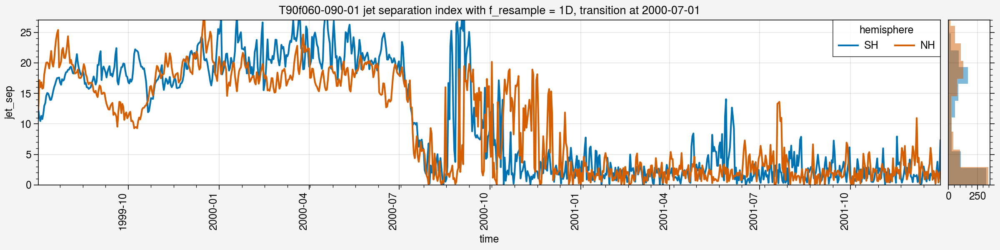

In [ ]:
fig, ax = pplt.subplots(figsize=(12,3))
ds_js.jet_sep.plot.line(x='time')

ax.set_title(f'{exp_name} jet separation index with f_resample = {f_res}')
if 'trans_date' in ds_zm:
    trans_date = np.datetime_as_string(ds_zm.trans_date.values, unit='D')
    ax.set_title(f'{exp_name} jet separation index with f_resample = {f_res}, transition at {trans_date}')

ax.set_ylim([0,27])

p_right = ax.panel('right')

p_right.hist(ds_js.jet_sep.sel(hemisphere='NH'), orientation='horizontal', alpha=0.5)
p_right.hist(ds_js.jet_sep.sel(hemisphere='SH'), orientation='horizontal', alpha=0.5)


fig.savefig(f'{exp_name}_jet_separation_index_{f_res}.{plot_format}')

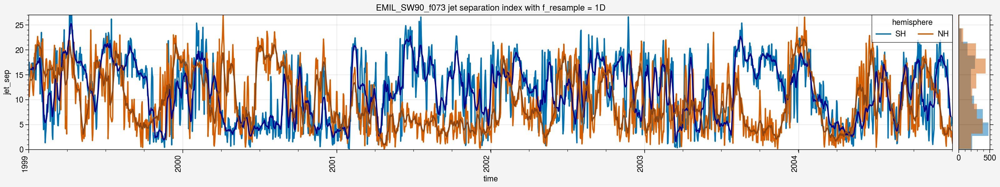

In [34]:
f_res = '1D'
fig, ax = pplt.subplots(figsize=(16,3))
#ds_js = calc_jet_sep_index(ds_zm, resample_freq=f_res)
ds_js.jet_sep.plot.line(x='time')

n_smooth = 10
ax.plot(ds_js.time, ds_js.jet_sep.rolling(time=n_smooth, center=True).mean('time').sel(hemisphere='SH'), color='darkblue')
ax.plot(ds_js.time, ds_js.jet_sep.rolling(time=n_smooth, center=True).mean('time').sel(hemisphere='NH'), color='saddlebrown')

ax.set_title(f'{exp_name} jet separation index with f_resample = {f_res}')
if 'trans_date' in ds_zm:
    trans_date = np.datetime_as_string(ds_zm.trans_date.values, unit='D')
    ax.set_title(f'{exp_name} jet separation index with f_resample = {f_res}, transition at {trans_date}')

ax.set_ylim([0,27])

p_right = ax.panel('right')

p_right.hist(ds_js.jet_sep.sel(hemisphere='NH'), orientation='horizontal', alpha=0.5)
p_right.hist(ds_js.jet_sep.sel(hemisphere='SH'), orientation='horizontal', alpha=0.5)


fig.savefig(f'{exp_name}_jet_separation_index_{f_res}.{plot_format}')

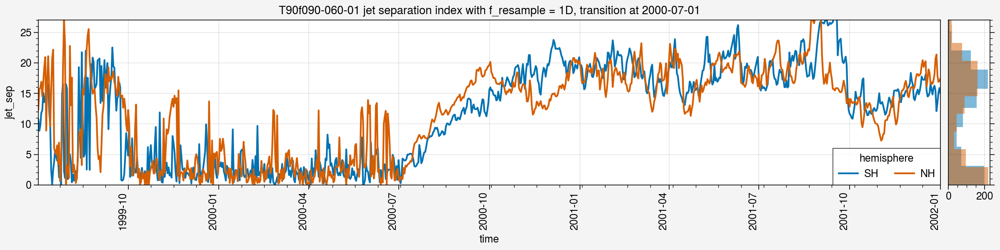

In [73]:
f_res = '1D'
fig, ax = pplt.subplots(figsize=(12,3))
ds_js_ref = calc_jet_sep_index(ds_zm_ref, resample_freq=f_res)
ds_js_ref.jet_sep.plot.line(x='time')

ax.set_title(f'{ref_name} jet separation index with f_resample = {f_res}')
if 'trans_date' in ds_zm:
    trans_date = np.datetime_as_string(ds_zm.trans_date.values, unit='D')
    ax.set_title(f'{ref_name} jet separation index with f_resample = {f_res}, transition at {trans_date}')

ax.set_ylim([0,27])

p_right = ax.panel('right')
p_right.hist(ds_js_ref.jet_sep.sel(hemisphere='NH'), orientation='horizontal', alpha=0.5)
p_right.hist(ds_js_ref.jet_sep.sel(hemisphere='SH'), orientation='horizontal', alpha=0.5)

fig.savefig(f'{ref_name}_jet_separation_index_{f_res}.{plot_format}')

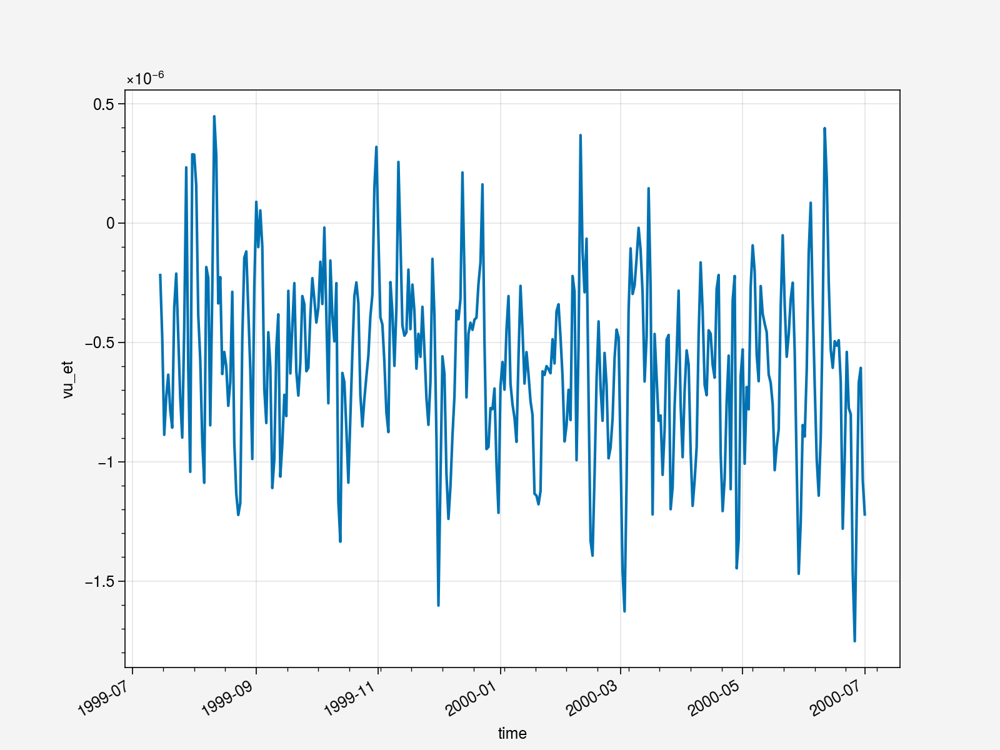

In [20]:
ds = ds_eq

lat_bc = [60,20]
plev_bc = [100,700]

ds = ds.sel(lat=slice(lat_bc[0], lat_bc[1]), plev=slice(plev_bc[0], plev_bc[1]))
ds = ds.weighted(weights(ds)).mean(['plev', 'lat', 'lon'])
ds.vu_et.plot()

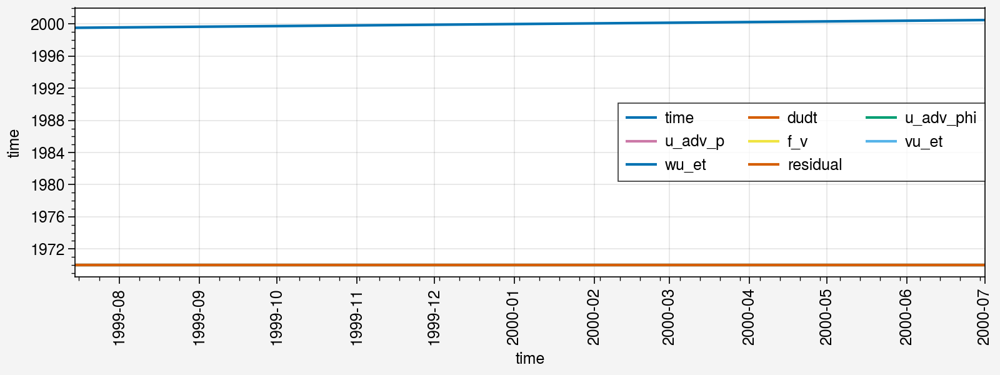

In [19]:
fig, ax = pplt.subplots(figsize=(8,3))

for var in ds.variables:
    ax.plot(ds.time, ds[var], label=var)
    
plt.legend()

In [ ]:
ds = ds_zm
mode = 'lat'
ds_res_full = ds.resample(time=f_res).mean('time')

time = ds.time
time_shift = ds.time[-1] - ds.time[0]
time_shifted = time + time_shift

if mode == 'lat':
    ds_nh = ds.sel(lat=slice(90,0))
    ds_sh = ds.sel(lat=slice(0,-90))
    ds_sh['lat'] = np.flipud(ds_nh.lat)
    ds_sh['time'] = time_shifted
    ds_sh_t = ds_sh.reindex({'lat':np.flipud(ds_sh.lat)})

ds_c = xr.concat([ds_nh, ds_sh_t], dim='time')
ds_c

In [ ]:
f_res = '3D'

vuet = ds_tp.vu_et.resample(time=f_res).mean('time').weighted(weights=vertical_weights(ds_tp)).mean('plev')
ds_js = calc_jet_sep_index(ds_zm, resample_freq=f_res)

factor = 0.5*np.pi*r_e * 2*np.pi*r_e
vuet_total_nh = factor * (vuet.sel(lat=slice(90,0))).sum('lat')
vuet_total_sh = factor * (vuet.sel(lat=slice(0,-90))).sum('lat')

In [ ]:
#ds_js_c = concat_hems_in_time_xr(ds_js, mode='hemisphere')
jet_sep_c = np.append(ds_js.jet_sep.sel(hemisphere='NH').values, ds_js.jet_sep.sel(hemisphere='SH').values) 
vuet_total_c = np.append(vuet_total_nh.values, vuet_total_sh.values)

In [ ]:
fig, ax = plt.subplots()

ax.scatter(jet_sep_c, vuet_total_c)
ax.set_title(f'Correlation: {np.corrcoef(jet_sep_c, vuet_total_c)[0,1]}')
ax.set_ylabel('total hemispheric momentum transport')

fig.savefig(f'{exp_name}_vuet_corr_jet_sep.{plot_format}')

In [ ]:
ds = ds_tp_int
var = 'vu_mt'
ds[var].mean('time').plot()
(ds[var] * np.sign(ds.lat)).mean('time').plot()

## EOFs

In [ ]:
resample_freq = '5D'

fig, ax, eofs = eof_analysis(ds_zm, resample_freq=resample_freq, lat_min=20)
fig.suptitle(f'EOFS for {exp_name}')
fig.show()
fig.savefig(f'{exp_name}_eofs_u_{resample_freq}.{plot_format}')

In [ ]:
fig, ax, eofs = eof_analysis(ds_zm_ref, resample_freq=resample_freq, lat_min=20)
fig.suptitle(f'EOFS for {ref_name}')
fig.show()
fig.savefig(f'{ref_name}_eofs_u_{resample_freq}.{plot_format}')


In [ ]:
n_modes = 4

fig, ax = pplt.subplots(nrows=n_modes)
edj_l, stj_l = calc_jet_lats_tropd(ds_res_full.mean('time'))[:2]
if hemisphere == 'NH':
    edj_l = edj_l[1]
    stj_l = stj_l[1]
else:
    edj_l = edj_l[0]
    stj_l = stj_l[0]

for i in range(n_modes):
    eofs.eofs.sel(mode=i, plev=slice(50,900)).plot.contourf(levels=16, ax=ax[i])
    ax[i].contour(ds_res.um1.sel(plev=slice(50,900)).mean('time'), color='black')
    
    lines = [edj_l, stj_l]
    ax[i].vlines(lines, [900], [50], color='black', linestyle='dashed')
    ax[i].set_ylim([850,50])
    
fig.savefig(f'{exp_name}_eofs_u_{resample_freq}_{hemisphere}.{plot_format}')

In [ ]:
eofs_phys = xr.cov(eofs.eofs, pcs, dim='time')

fig, ax = pplt.subplots(nrows=n_modes)

for i in range(n_modes):
    eofs_phys.sel(mode=i).plot.contourf(levels=16, ax=ax[i])
    
    ax[i].set_ylim([900,50])
    
fig.savefig(f'{exp_name}_eofs_phys_u_{resample_freq}_{hemisphere}.{plot_format}')

In [ ]:
def calc_regression_on_index(da, da_in):
    
    
    return

In [3]:
ds_js.jet_sep.plot.line(x='time', figsize=(10,3))
plt.ylabel('jet separation [°]')

NameError: name 'ds_js' is not defined

In [4]:
fig, ax = pplt.subplots(figsize=(8,4))
ax.contour(ds_mm_ref.um1.isel(time=slice(32,36)).mean('time'), color='black')
ax.contour(ds_mm_ref.um1.isel(time=32), color='green')
ax.set_ylim([1000,1])

NameError: name 'pplt' is not defined

In [5]:
fig, ax = pplt.subplots(figsize=(8,4))
#ax.contour(ds_mm.um1.isel(time=slice(6,10)).mean('time'), color='green')
ax.contour(ds_mm.um1.isel(time=5), color='green')
ax.contour(ds_mm.um1.mean('time'), color='black')
ax.set_ylim([1000,1])
ax.set_title(exp_name+'wind clim and exemplary month')
#fig.savefig(f'example_jet_clim.{plot_format}')

NameError: name 'pplt' is not defined

## Calculation of vertical weights

Text(0.5, 0, 'pressure level number')

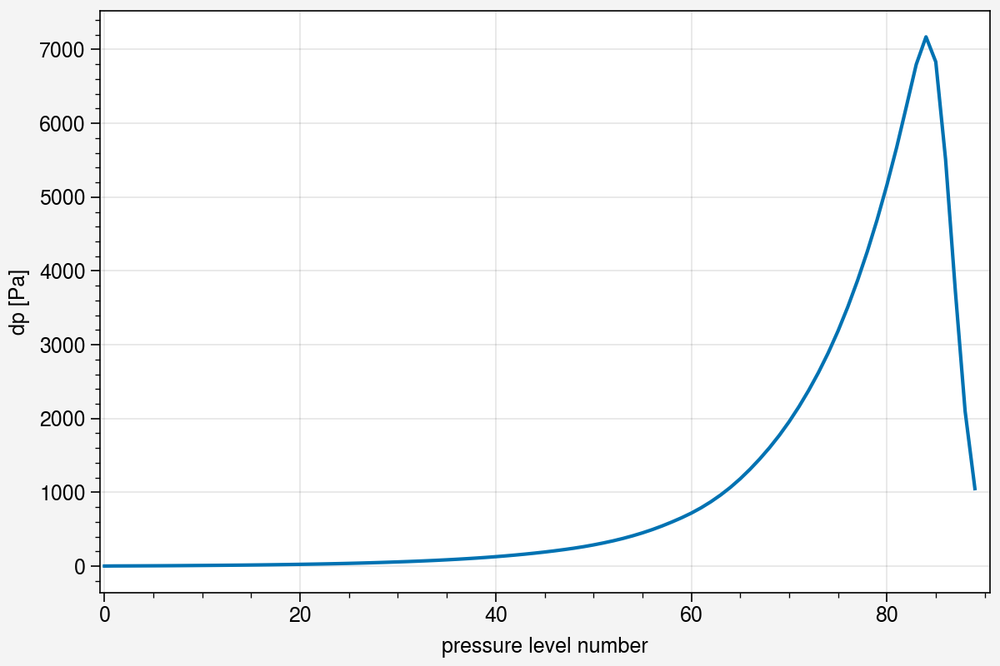

In [27]:
vert_weights = vertical_weights(ds_zm)
total_weights = weights(ds_zm)
fig, ax = pplt.subplots(figsize=(6,4))
ax.plot(np.arange(0,vert_weights.size,1), vert_weights*100)
ax.set_ylabel('dp [Pa]')
ax.set_xlim([-0.5, 90.5])
ax.set_xlabel('pressure level number')
#fig.savefig('mean_dp_plev.png')

## radiative (convective) equilibria

In [4]:
setup = get_setup_from(exp_name)
params = Params_HS_PK()
params.Ty = get_ty_from(exp_name)
params.T1 = get_tmax_from(exp_name)
t_equ = relax_submodel(setup, np.radians(ds_zm.lat.values), ds_zm.plev.values*100, p=params)
t_radconv = relax_moist_adiabat(t_equ, fg=get_fgamma_from(exp_name)).interp(plev=ds_zm.plev).interp(lat=ds_zm.lat)

setup = get_setup_from(ref_name)
params_ref = Params_HS_PK()
params_ref.Ty = get_ty_from(ref_name)
params_ref.T1 = get_tmax_from(ref_name)
t_equ_ref = relax_submodel(setup, np.radians(ds_zm_ref.lat.values), ds_zm_ref.plev.values*100, p=params_ref)
t_radconv_ref = relax_moist_adiabat(t_equ, fg=get_fgamma_from(ref_name)).interp(plev=ds_zm.plev).interp(lat=ds_zm.lat)

print(t_equ.weighted(weights(t_equ)).mean())
print(t_radconv.weighted(weights(t_radconv)).mean())
print(t_equ_ref.weighted(weights(t_equ_ref)).mean())

KeyError: 'Experiment name trop_SW90_f070 not in dictionary yet!'

In [ ]:
ds_zm.tm1.weighted(weights(ds_zm)).mean()

In [ ]:
t_equ_pksw = relax_submodel('PKSW', np.radians(ds_zm.lat.values), ds_zm.plev.values*100)
t_equ_pk = relax_submodel('PK', np.radians(ds_zm.lat.values), ds_zm.plev.values*100)
t_equ_pk_nv = relax_submodel('PK', np.radians(ds_zm.lat.values), ds_zm.plev.values*100, no_polar_vortex=True)


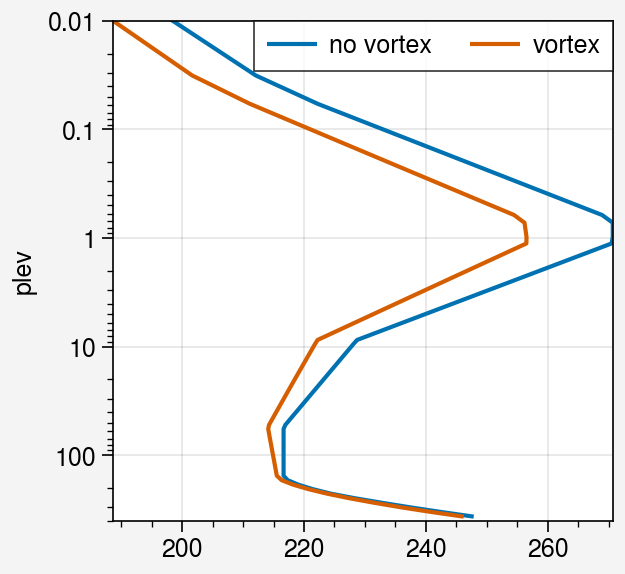

In [94]:
fig, ax = pplt.subplots()
lat_bound = 90
t_equ_1 = t_equ_pk_nv.sel(plev=slice(0,400), lat=slice(lat_bound,-lat_bound))
t_equ_2 = t_equ_pk.sel(plev=slice(0,400), lat=slice(lat_bound,-lat_bound))

ax.plot(t_equ_1.weighted(np.cos(np.radians(t_equ_1.lat))).mean(['lat']), t_equ_1.plev, label='no vortex')
ax.plot(t_equ_2.weighted(np.cos(np.radians(t_equ_2.lat))).mean(['lat']), t_equ_2.plev, label='vortex')

ax.set_ylim([400,0.01])
ax.set_yscale('log')
ax.legend()
#fig.savefig(f'Mean_strat_t_equ_vortex_no_vortex_lats0-{lat_bound}.{plot_format}')

## Streamfunction calculation via TropD package

function: 

$ \frac{2\pi a cos \phi}{g} \int_{0}^{p} v dp $

In [26]:
ds = ds_zm.mean('time')

#eulerian mean stream function
ds_zm = calc_stream_function_xr(ds_zm)
ds_zm['theta'] = calc_theta(ds_zm)

ds_zm_ref = calc_stream_function_xr(ds_zm_ref)
ds_zm_ref['theta'] = calc_theta(ds_zm_ref)

# eddy transport of potential temperature
ds_tp['vtheta_et'] = ds_tp.vT_et * (p00/ds_zm.plev) ** (r_air/cp)
ds_zm['z_logp'] = - scale_height * np.log(ds_zm.plev/p00)

ds_tp_ref['vtheta_et'] = ds_tp_ref.vT_et * (p00/ds_zm_ref.plev) ** (r_air/cp)
ds_zm_ref['z_logp'] = - scale_height * np.log(ds_zm_ref.plev/p00)

# TEM streamfunction
nlevs = ds_zm.plev.size
ds_sel = ds_zm.isel(plev=slice(1,nlevs-1))
ds = ds_zm 

dtheta_dp = calc_da_derivative(ds.theta, ds.plev)
vtheta_et_scaled_dp = calc_da_derivative(ds_tp.vtheta_et.mean('time')/dtheta_dp.mean('time'), ds.plev)

#dtheta_dp = ds.theta.differentiate('plev') / 100
#vtheta_et_scaled_dp = (ds_tp.vtheta_et.mean('time')/dtheta_dp.mean('time')).differentiate('plev') / 100

ds_zm['psi_star'] = (ds_zm.psi - np.cos(np.radians(ds_zm.lat)) * 2 * np.pi * r_e / g0 
                     * ds_tp.vtheta_et.mean('time')/dtheta_dp.mean('time'))

ds_zm['v_star'] = ds_zm.vm1.mean('time') - vtheta_et_scaled_dp

psi_alt = tropdf.TropD_Calculate_StreamFunction(ds_zm.v_star.values.T, 
                                            ds_zm.lat.values,
                                            ds_zm.plev.values)

ds_zm['psi_star_alt'] = (['plev', 'lat'], psi_alt.T)

## Baroclinic Slope

In [30]:
bc_slope, dtheta_dy, dtheta_dlogp = calc_baroclinic_slope(ds_zm)

In [31]:
nlevs = ds_zm.plev.size
nlats = ds_zm.lat.size

bc_slope = calc_baroclinic_slope(ds_zm)[0].to_dataset(name='bc_slope')
#ds_zm = xr.merge([bc_slope, ds_zm], compat='override', join='outer')

bc_slope_ref = calc_baroclinic_slope(ds_zm_ref)[0].to_dataset(name='bc_slope')
#ds_zm_ref = xr.merge([bc_slope_ref, ds_zm_ref], compat='override', join='left')

#bc_slope_ref.bc_slope.isel(z_logp=slice(0,nlevs-4)).mean('time').plot()
#plt.yscale('linear')
#plt.ylim([0,20000])
#plt.savefig(f'{exp_name}_baroclinic_slope_logp.{plot_format}')

# Visualizations

## Climatologies

(1013.0, 10.0)

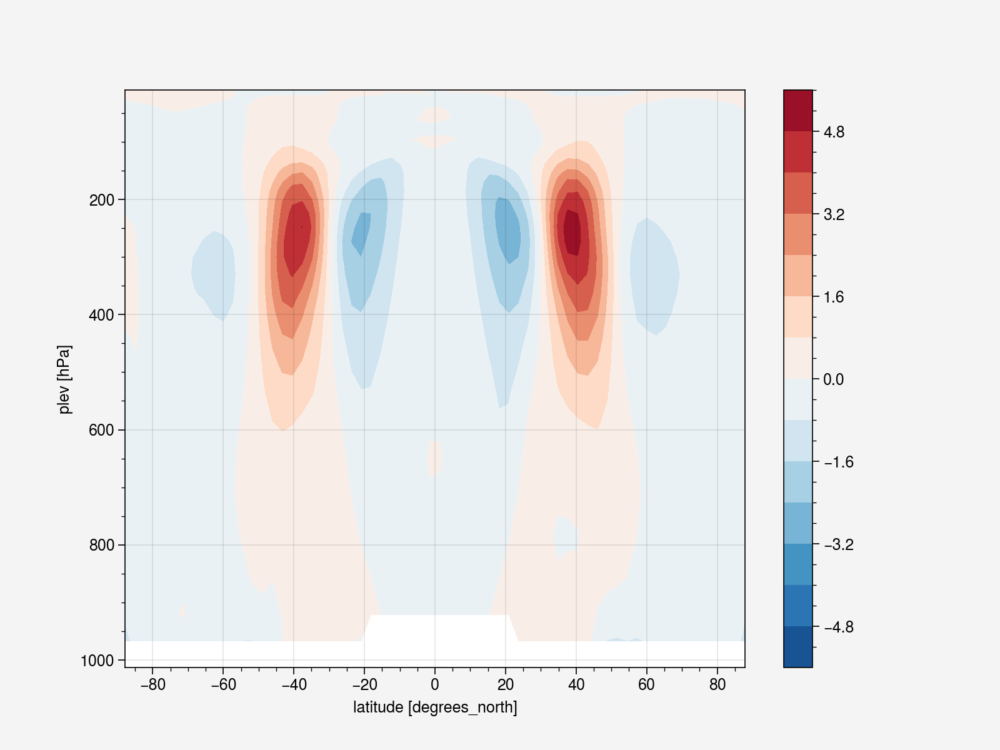

In [23]:
(- (ds_eq.vu_et + ds_eq.wu_et/100).T * 3600 * 24).mean('time').plot.contourf(levels=16)
plt.ylim(ylims)

(1013.0, 10.0)

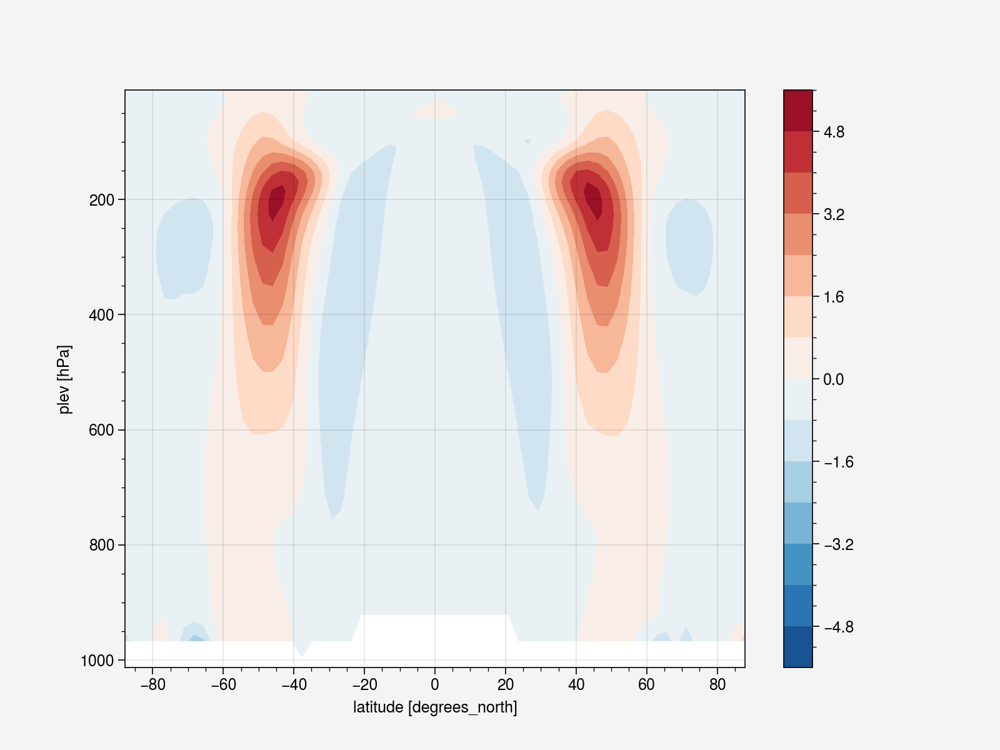

In [24]:
(- (ds_eq_ref.vu_et + ds_eq_ref.wu_et/100).T * 3600 * 24).mean('time').plot.contourf(levels=16)
plt.ylim(ylims)

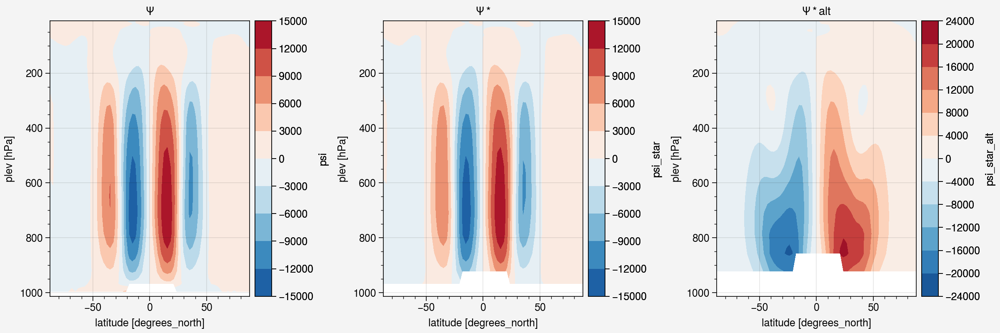

In [30]:
def plot_TEM_psi(ds):

    fig, ax = pplt.subplots(figsize=(12,4), ncols=3, share=False)

    (ds.psi.T/r_e).plot.contourf(ax=ax[0], levels=12)
    ax[0].set_title(r'$\Psi$')
    (ds.psi_star.T/r_e).plot.contourf(ax=ax[1], levels=12)
    ax[1].set_title(r'$\Psi*$')
    (ds.psi_star_alt/r_e).plot.contourf(ax=ax[2], levels=12)
    ax[2].set_title(r'$\Psi* alt$')
    for a in ax:
        a.set_ylim(ylims)
        
    return fig, ax

fig, ax = plot_TEM_psi(ds_zm.mean('time'))

fig.savefig(f'{exp_name}_psi_psi_star_comp_wo_r_e.{plot_format}')

Text(0.5, 0.98, 'EMIL_SW90_f080 Climatology')

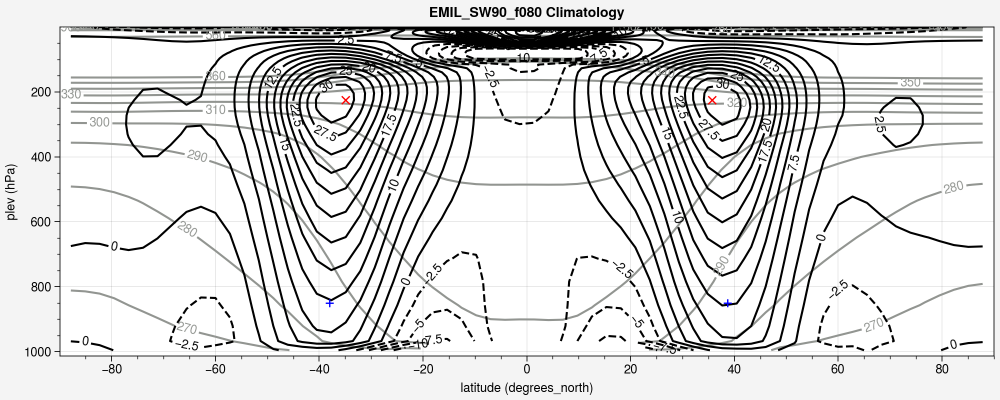

In [31]:
ds = ds_zm
yscale='linear'

fig, ax = plot_theta_u_zm_clim(ds.mean('time'), yscale=yscale)
fig.suptitle(f'{exp_name} Climatology')
#fig.savefig(f'{exp_name}_clim_theta.{plot_format}')
#ax.set_ylim([100,0.01])
#ax.set_xlim([30,90])

Text(0.5, 0.98, 'EMIL_SW90_f070 Climatology')

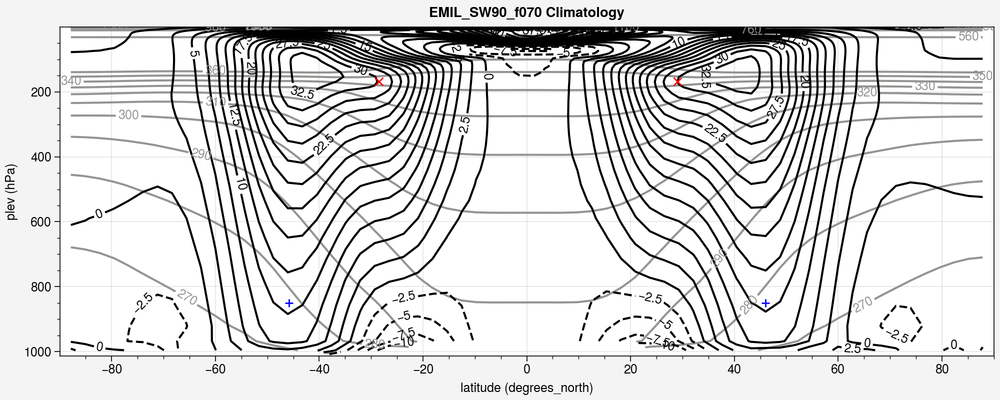

In [32]:
ds = ds_zm_ref #.sel(time=slice('01-2000','06-2000'))

fig, ax = plot_theta_u_zm_clim(ds.mean('time'), yscale=yscale)
fig.suptitle(f'{ref_name} Climatology')

#fig.savefig(f'{ref_name}_clim_theta.{plot_format}')


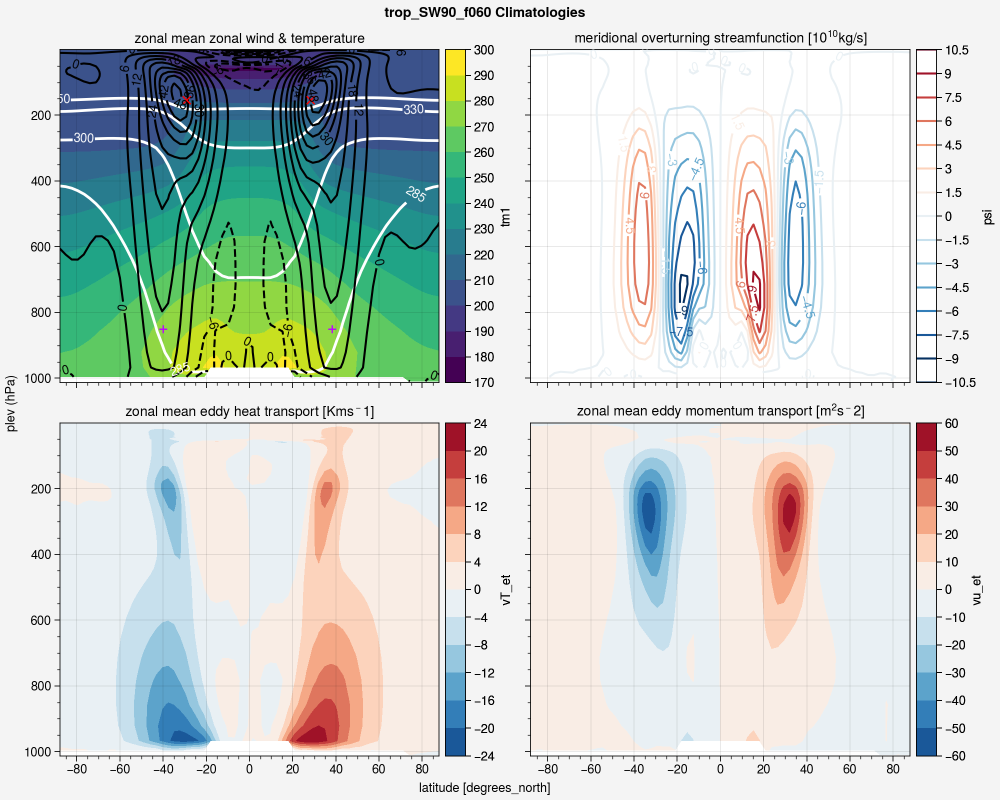

In [35]:
fig, ax, lat_stj, lat_edj = plot_zm_climatologies(ds_zm, ds_tp, yscale=yscale)
fig.suptitle(f'{exp_name} Climatologies')
fig.save(f'{exp_name}_zm_fields.{plot_format}')

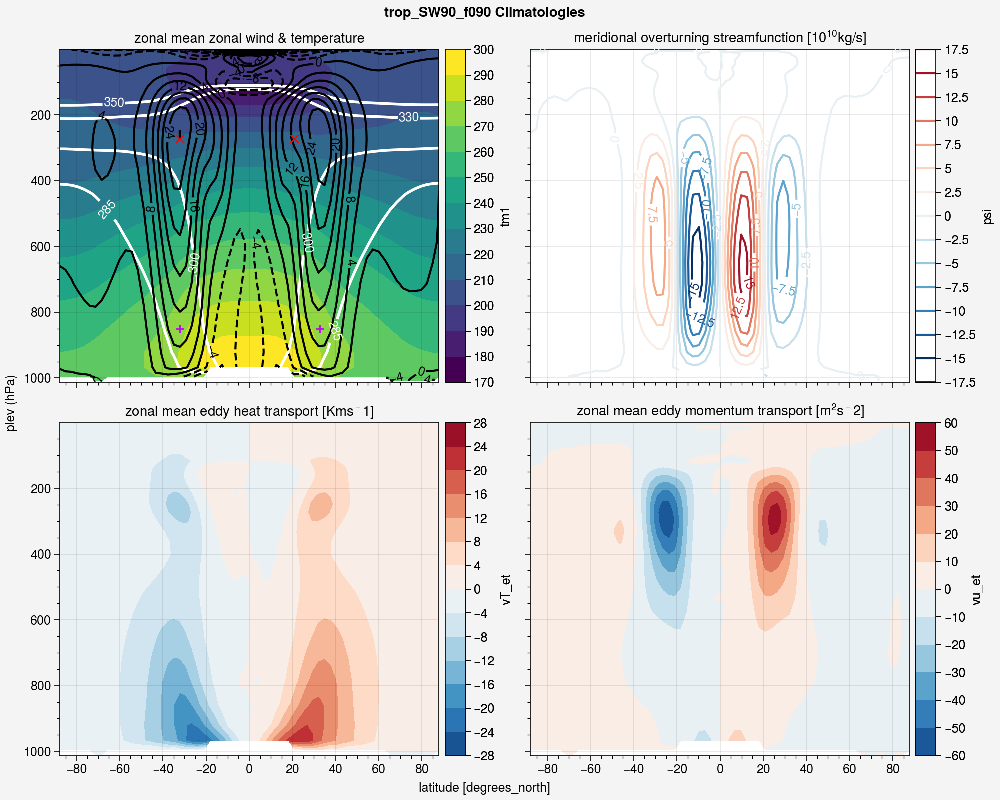

In [36]:
fig, ax = plot_zm_climatologies(ds_zm_ref, ds_tp_ref, yscale=yscale)[:2]
fig.suptitle(f'{ref_name} Climatologies')
fig.save(f'{ref_name}_zm_fields.{plot_format}')

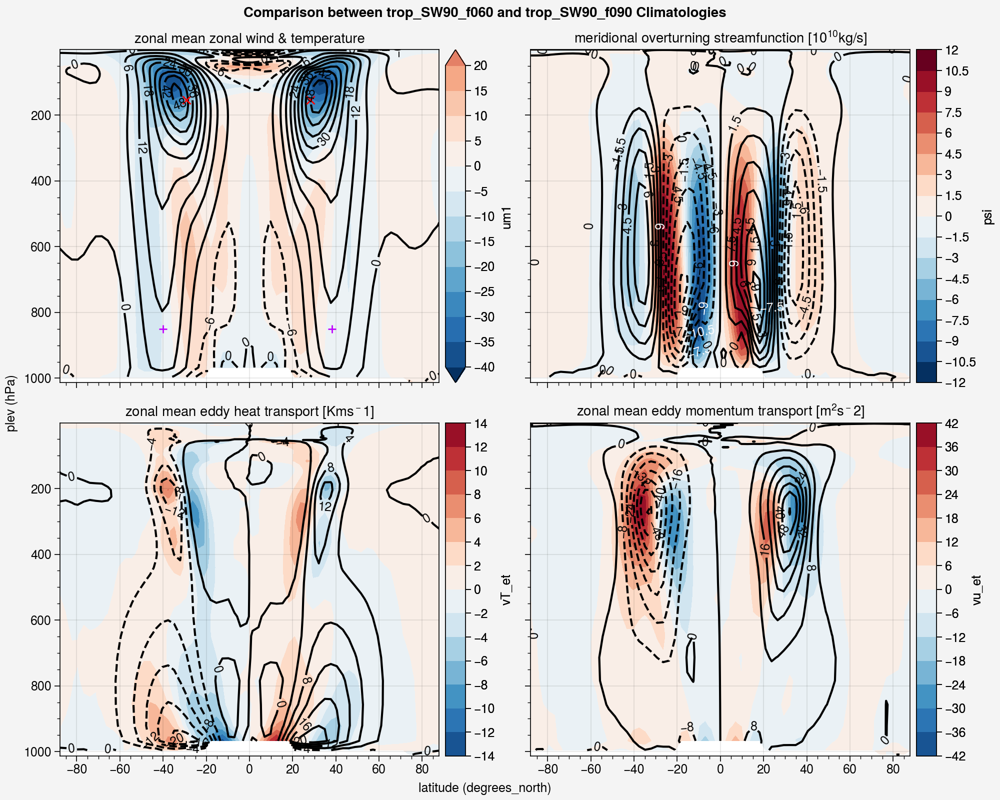

In [37]:
fig, ax = plot_zm_climatologies(ds_zm, ds_tp, ds_zm_ref, ds_tp_ref, yscale=yscale)[:2]
fig.suptitle(f'Comparison between {exp_name} and {ref_name} Climatologies')
fig.save(f'{exp_name}-ref_zm_fields.{plot_format}')

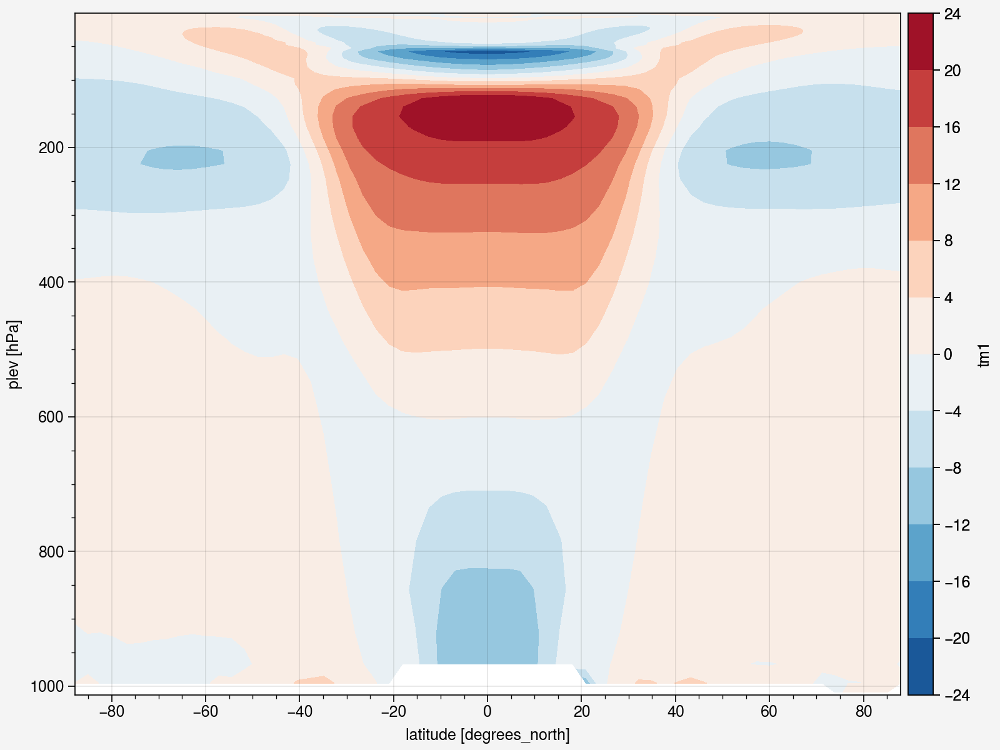

In [38]:
ylims=[1013,1]
fig, ax = pplt.subplots(figsize=(8,6))
(ds_zm.mean(['time']) - ds_zm_ref.mean(['time'])).tm1.plot.contourf(levels=15, yscale=yscale, ylim=ylims)
fig.save(f'{exp_name}-{ref_name}_zm_temperature.{plot_format}')

NameError: name 't_equ' is not defined

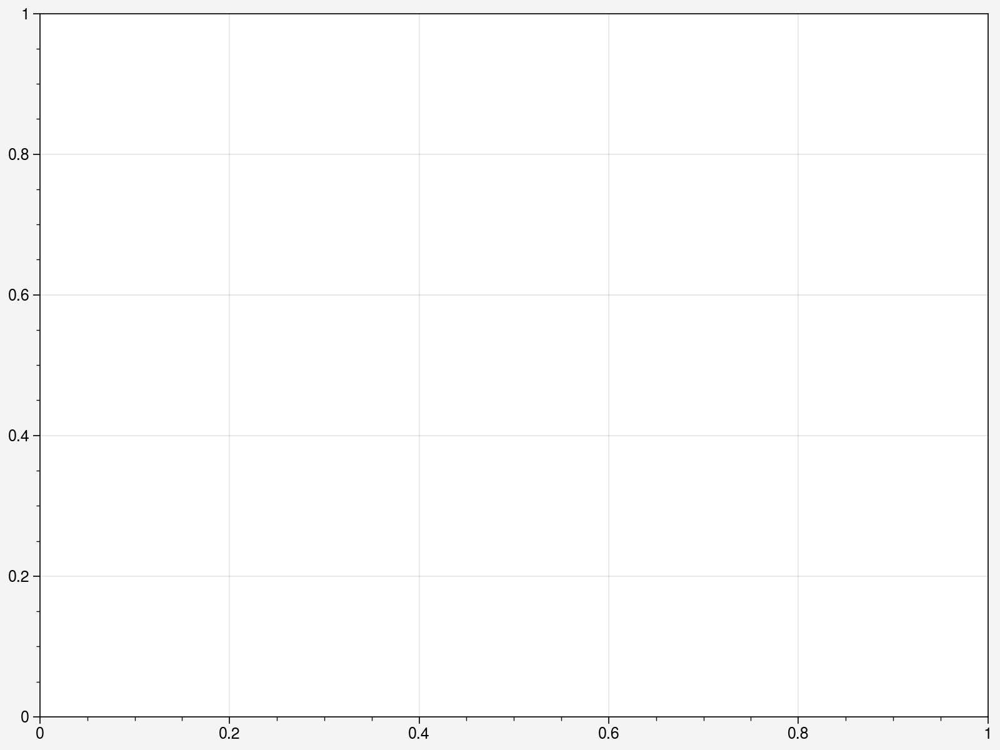

In [39]:
ylims=[1013,1]
fig, ax = pplt.subplots(figsize=(8,6))
ax.contourf(ds_zm.lat, ds_zm.plev, (ds_zm.mean(['time']).tm1 - t_equ), levels=15, colorbar='right')
ax.set_ylim(ylims)
ax.set_yscale(yscale)
ax.set_title(f'{exp_name} T clim. - T_eq (rad-conv)')
fig.save(f'{exp_name}_zm_t-t_eq.{plot_format}')

In [19]:
ylims=[1013,1]

ds = ds_zm
t_equ_rc = t_radconv

t_avg = ds.tm1.weighted(total_weights).mean(['lat', 'plev', 'time'])
t_equ_avg = t_equ_rc.weighted(weights(t_equ_rc)).mean(['lat','plev'])

fig, ax = pplt.subplots(figsize=(8,6))
ax.contourf(ds.lat, ds.plev, (ds.mean(['time']).tm1 - (t_equ_rc + (t_avg - t_equ_avg))), levels=15, colorbar='right')
ax.set_ylim([1000,50])
ax.set_yscale(yscale)
ax.set_title(f'{exp_name} T clim. - T_eq (rad-conv)')
ax.set_yscale('log')
fig.save(f'{exp_name}_zm_t-t_eq.{plot_format}')

NameError: name 't_radconv' is not defined

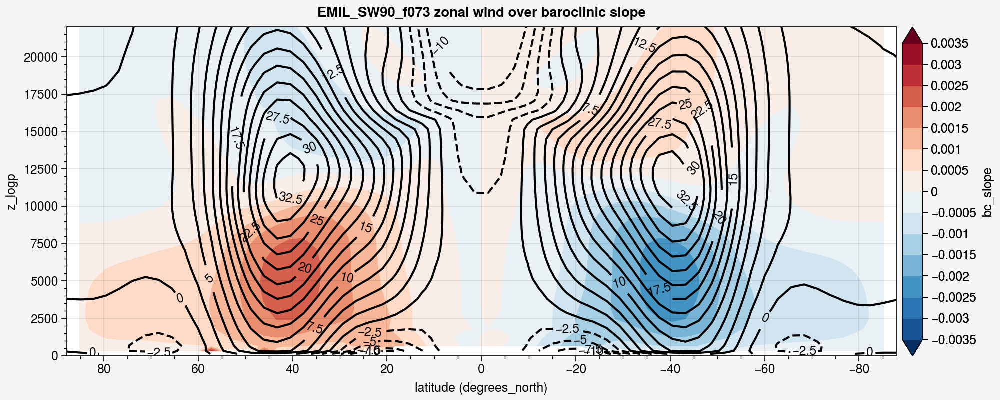

In [73]:
fig, ax = plot_bc_slope_u_zm_clim(ds_zm, bc_slope)
fig.suptitle(f'{exp_name} zonal wind over baroclinic slope')
fig.savefig(f'{exp_name}_bc_slope_u.{plot_format}')

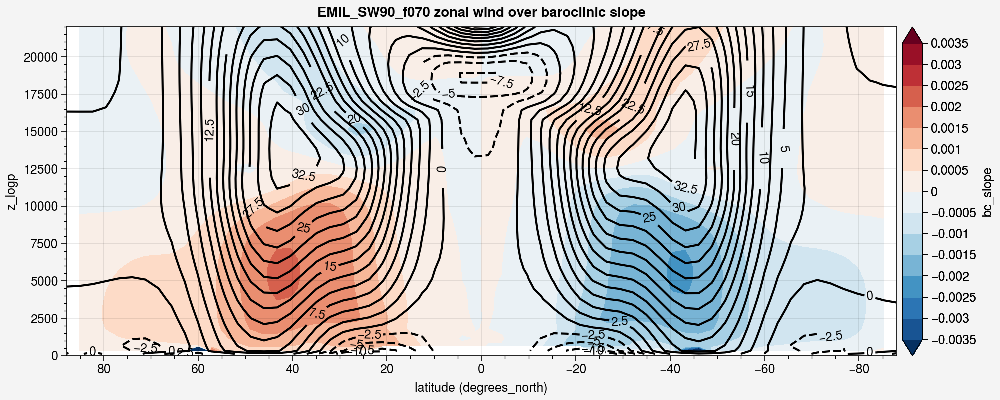

In [75]:
fig, ax = plot_bc_slope_u_zm_clim(ds_zm_ref, bc_slope_ref)
fig.suptitle(f'{ref_name} zonal wind over baroclinic slope')
fig.savefig(f'{ref_name}_bc_slope_u.{plot_format}')

(1013.0, 10.0)

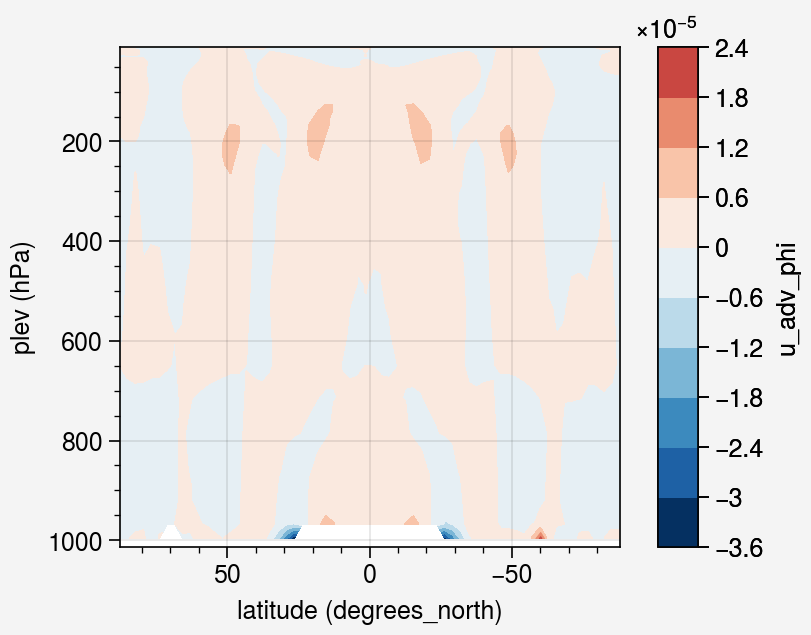

In [47]:
fig, ax = pplt.subplots()

ax.contourf(ds_eq.lat, ds_eq.plev, ds_eq.u_adv_phi.mean('time'), colorbar='right')
ax.set_ylim(ylims)

In [ ]:
fig, ax = plot_dtdz_clim(ds_zm.mean('time'))

fig.savefig(f'{exp_name}_dtdz_climatology.{plot_format}')


## Theta Profiles


In [28]:
ds.time[0].values

numpy.datetime64('1999-07-01T00:00:00.000000000')

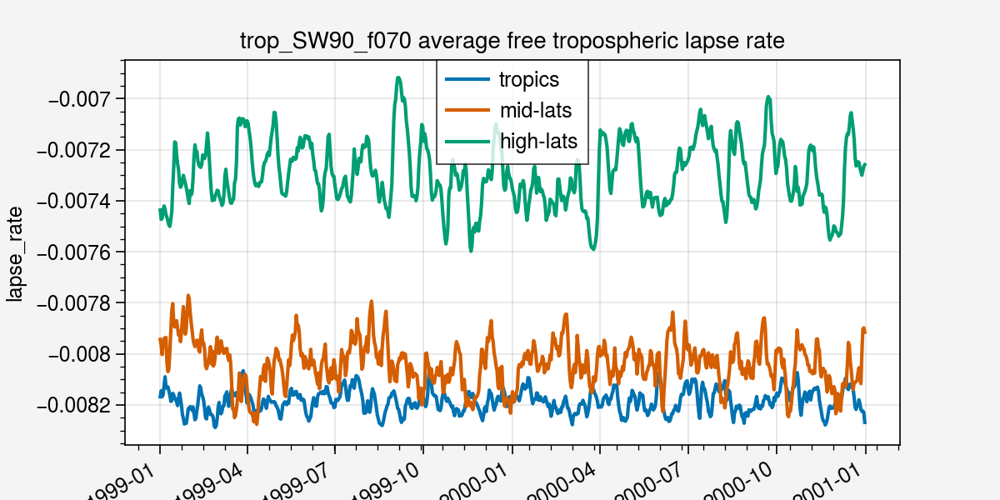

In [20]:
"""
scale_height = 7000
ds_equ = t_equ.to_dataset(name='t_equ')
z_logp = - scale_height * np.log(ds_equ.plev/p00)

ds_equ_free_trop = ds_equ.sel(plev=slice(300,700))
ds_equ_free_trop['lapse_rate'] = calc_da_derivative(ds_equ.t_equ, (z_logp), coord_name='plev')
"""

ds = calc_avg_btw_hemispheres(ds_zm)

fig, ax = plt.subplots(figsize=(6,3))

ds_free_trop = ds.sel(plev=slice(500,850))
ds_free_trop['lapse_rate'] = calc_da_derivative(ds_free_trop.tm1, ds_free_trop.z_logp, coord_name='plev')

ds_free_trop.lapse_rate.sel(lat=slice(0,20)).mean(['lat','plev']).plot(ax=ax, label='tropics')
ds_free_trop.lapse_rate.sel(lat=slice(40,60)).mean(['lat','plev']).plot(ax=ax, label='mid-lats')
ds_free_trop.lapse_rate.sel(lat=slice(70,90)).mean(['lat','plev']).plot(ax=ax, label='high-lats')

#ax.hlines([ds_equ_free_trop.lapse_rate.sel(lat=slice(20,-20)).mean(['lat','plev']).values], xmin=ds.time[0].values, xmax=ds.time[-1].values)
#ax.hlines(ds_equ_free_trop.lapse_rate.sel(lat=slice(60,40)).mean(['lat','plev']).values, xmin=ds.time[0].values, xmax=ds.time[-1].values, color='tab:orange')
#ax.hlines(ds_equ_free_trop.lapse_rate.sel(lat=slice(90,70)).mean(['lat','plev']).values, xmin=ds.time[0].values, xmax=ds.time[-1].values, color='tab:green')

ax.set_title(f'{exp_name} average free tropospheric lapse rate')
ax.legend()
fig.savefig(f'{exp_name}_laps_rate_evolution.{plot_format}')

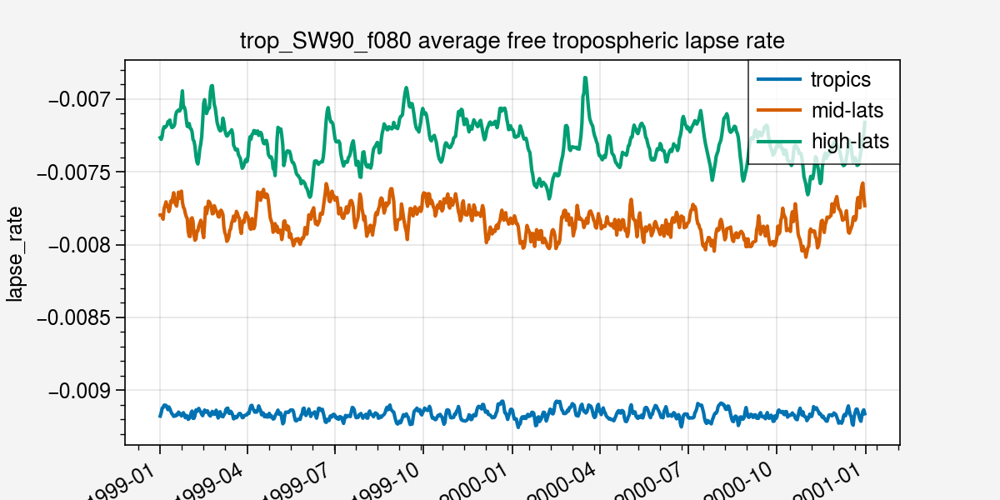

In [21]:
"""
scale_height = 7000
ds_equ = t_equ.to_dataset(name='t_equ')
z_logp = - scale_height * np.log(ds_equ.plev/p00)

ds_equ_free_trop = ds_equ.sel(plev=slice(300,700))
ds_equ_free_trop['lapse_rate'] = calc_da_derivative(ds_equ.t_equ, (z_logp), coord_name='plev')
"""

ds = calc_avg_btw_hemispheres(ds_zm_ref)

fig, ax = plt.subplots(figsize=(6,3))

ds_free_trop = ds.sel(plev=slice(500,850))
ds_free_trop['lapse_rate'] = calc_da_derivative(ds_free_trop.tm1, ds_free_trop.z_logp, coord_name='plev')

ds_free_trop.lapse_rate.sel(lat=slice(0,20)).mean(['lat','plev']).plot(ax=ax, label='tropics')
ds_free_trop.lapse_rate.sel(lat=slice(40,60)).mean(['lat','plev']).plot(ax=ax, label='mid-lats')
ds_free_trop.lapse_rate.sel(lat=slice(70,90)).mean(['lat','plev']).plot(ax=ax, label='high-lats')

#ax.hlines([ds_equ_free_trop.lapse_rate.sel(lat=slice(20,-20)).mean(['lat','plev']).values], xmin=ds.time[0].values, xmax=ds.time[-1].values)
#ax.hlines(ds_equ_free_trop.lapse_rate.sel(lat=slice(60,40)).mean(['lat','plev']).values, xmin=ds.time[0].values, xmax=ds.time[-1].values, color='tab:orange')
#ax.hlines(ds_equ_free_trop.lapse_rate.sel(lat=slice(90,70)).mean(['lat','plev']).values, xmin=ds.time[0].values, xmax=ds.time[-1].values, color='tab:green')

ax.set_title(f'{ref_name} average free tropospheric lapse rate')
ax.legend()
fig.savefig(f'{ref_name}_laps_rate_evolution.{plot_format}')

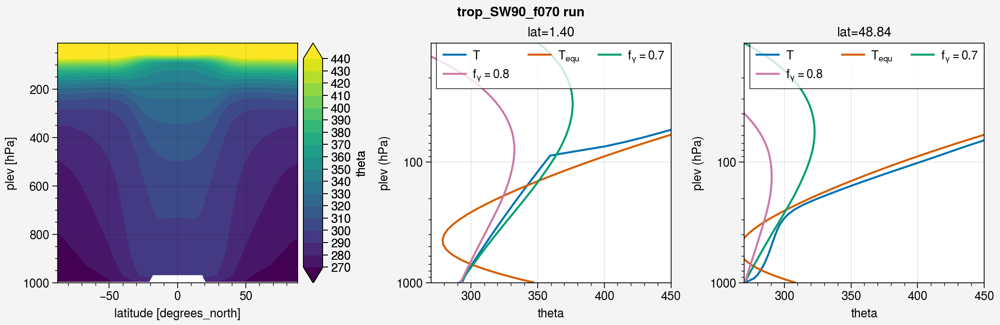

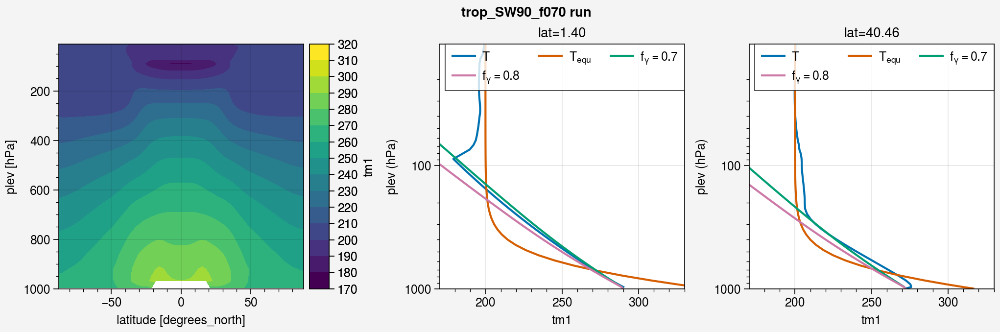

In [23]:
fig, ax = plot_theta_profiles(ds_zm.sel(plev=slice(10,1000)), exp_name, fgammas=[0.7, 0.8])
fig2, ax2 = plot_t_profiles(ds_zm.sel(plev=slice(10,1000)), exp_name, fgammas=[0.7, 0.8])
fig2.savefig(f'{exp_name}_t_cmp.{plot_format}')

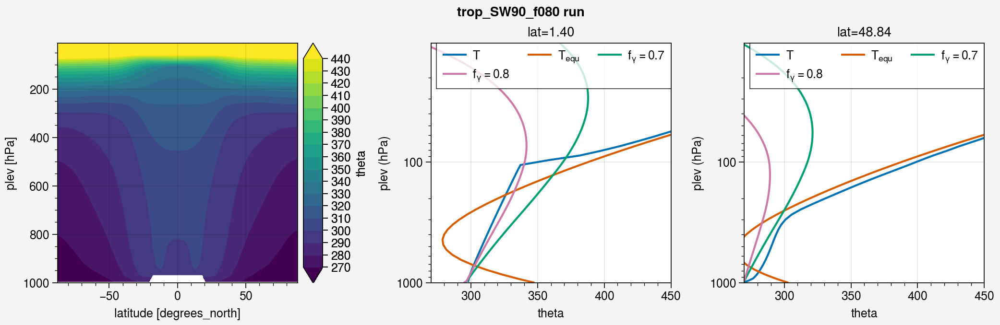

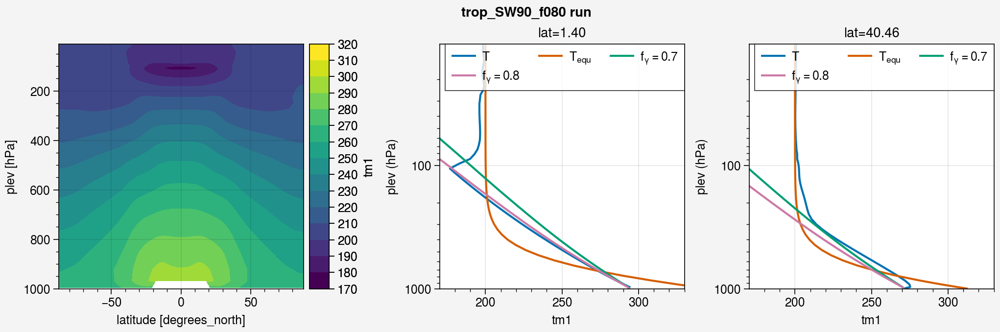

In [25]:
fig, ax = plot_theta_profiles(ds_zm_ref.sel(plev=slice(10,1000)), ref_name, fgammas=[0.7, 0.8])
fig2, ax2 = plot_t_profiles(ds_zm_ref.sel(plev=slice(10,1000)), ref_name, fgammas=[0.7, 0.8])
fig2.savefig(f'{ref_name}_t_cmp.{plot_format}')

In [ ]:
ds = ds_zm.sel(lat=0, method='nearest')
fig, ax = pplt.subplots(figsize=(12,5))
ds.um1.T.plot(ax=ax, levels=np.arange(-30,30.1,2.5))
ax.set_ylim(ylims)
#fig.savefig(f'{exp_name}_u_eq_evolution.{plot_format}')

In [ ]:
fig, ax = pplt.subplots()
ds_tp.wu_et.mean('time').plot(ax=ax, levels=20)
ax.set_ylim(ylims)
#fig.savefig(f'{exp_name}_wuet_clim.{plot_format}')

In [ ]:
fig, ax = pplt.subplots()

ax.contourf(ds_zm.lat, ds_zm.plev, ds_zm.vervel.mean('time'), colorbar='r')
ax.set_ylim(ylims)
ax.set_title('Zonal mean vertical velocity [Pa/s]')


In [ ]:
fig, ax = pplt.subplots()
ds = ds_zm.sel(plev=slice(100,950))

ax.contourf(ds.lat, ds.plev, ds.vm1.mean('time'), colorbar='r')
ax.set_ylim([900,100])
ax.set_xlim([-90,90])
ax.set_title('Zonal mean meridional velocity [Pa/s]')


In [ ]:
ds_tp.wu_mt.mean('time').differentiate('plev').plot()
plt.ylim(ylims)

## Transports

EMIL_SW90_f070


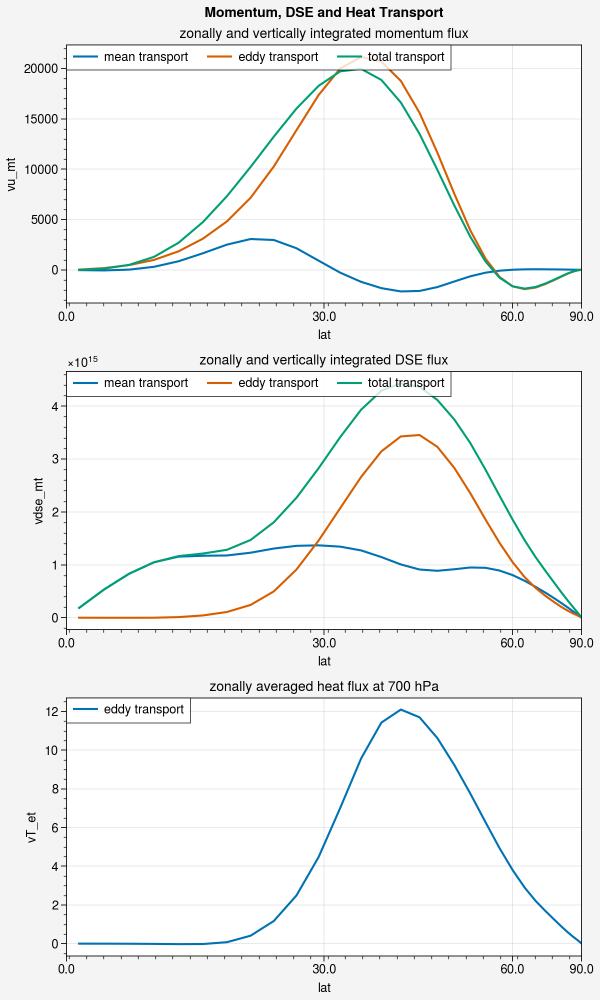

In [53]:
ds_tp_int_ref_avg = calc_avg_btw_hemispheres(ds_tp_int_ref)
fig, ax = plot_transports(ds_tp_int_ref_avg)
ax.set_xlim([0,1])
fig.save(f'{ref_name}_fluxes.{plot_format}')
print(ref_name)

EMIL_SW90_f073


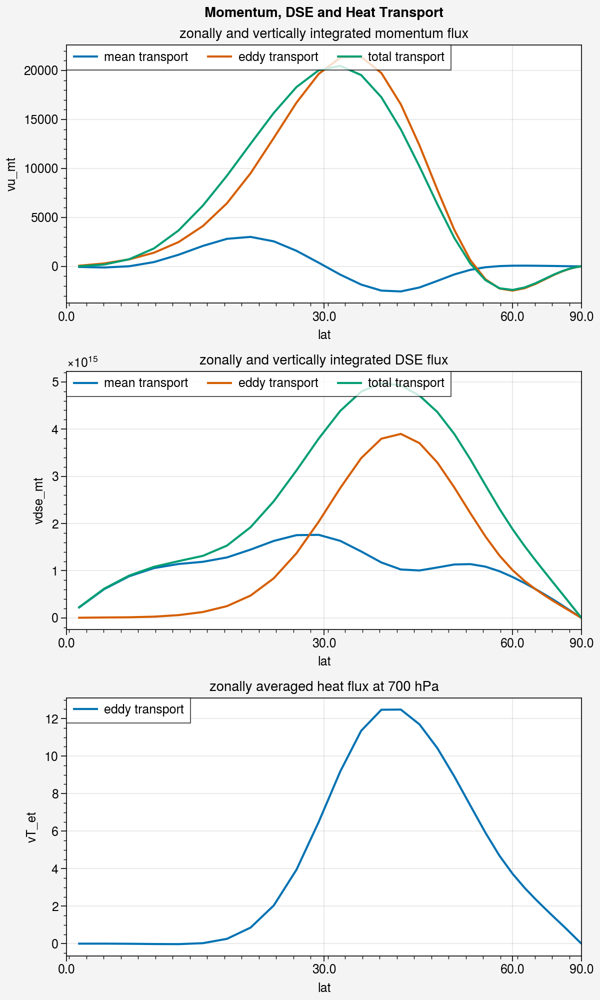

In [52]:
ds_tp_int_avg = calc_avg_btw_hemispheres(ds_tp_int)
fig, ax = plot_transports(ds_tp_int_avg)
ax.set_xlim([0,1])
fig.save(f'{exp_name}_fluxes.{plot_format}')
print(exp_name)

In [45]:
ds_tp_int_avg

<xarray.Dataset>
Dimensions:  (lat: 32, time: 1096)
Coordinates:
  * time     (time) datetime64[ns] 2000-01-01 2000-01-02 ... 2002-12-31
    plev     int64 700
  * lat      (lat) float64 1.395 4.186 6.977 9.767 ... 79.53 82.31 85.1 87.86
Data variables:
    vT_mt    (lat, time) float64 -3.945 -5.753 -8.553 ... 0.1483 0.1234 0.08349
    vT_et    (lat, time) float64 -0.00207 0.001369 0.001253 ... 0.04277 0.04593
    vu_mt    (lat, time) float32 -45.76 -46.78 -43.86 ... 4.354 2.149 0.1201
    vu_et    (lat, time) float32 104.6 3.28 -75.14 ... -11.95 -24.87 -11.42
    wu_mt    (lat, time) float32 5.706 5.834 5.624 ... -0.3985 -0.3509 -0.0565
    wu_et    (lat, time) float32 4.199 2.366 0.103 ... 0.1106 0.6539 0.8628
    vdse_mt  (lat, time) float32 1.998e+14 1.85e+14 ... 5.737e+12 6.522e+12
    vdse_et  (lat, time) float32 3.004e+12 3.314e+12 ... 1.827e+12 7.822e+12

## Horizontal Fields

In [ ]:
ds_pls_ref

In [ ]:
ds_pls.vervel.sel(plev=500, method='nearest', time='2000-03-01').plot()
plt.savefig(f'{exp_name}_vervel_snapshot.{plot_format}')

In [ ]:
ds_pls_ref.vervel.sel(plev=500, method='nearest', time='2000-03-01').plot()
plt.savefig(f'{ref_name}_vervel_snapshot.{plot_format}')

In [ ]:
def plot_hor_fields(ds, variable, savefig=False, anom=False, fig=None, ax=None):
    
    nlevs = ds.plev.size
    if fig is None:
        fig, ax = pplt.subplots(ncols=nlevs)
        
    
    for i in range(nlevs):
        if anom:
            ax[i].contourf(ds.lon, ds.lat, (ds[variable].isel(plev=i) - ds[variable].isel(plev=i).mean(['lon'])).mean('time') , colorbar='r')
            fig.suptitle(f'stationary eddy fields of {variable}')
        else:
            ax[i].contour(ds.lon, ds.lat, ds[variable].isel(plev=i).mean('time'), color='black')
            fig.suptitle(f'stationary fields of {variable}')
            
        ax[i].set_ylim([0,90])
        ax[i].set_title(f'pressure: {np.round(ds.plev.values[i], 0)} hPa')
        
    if savefig:
        fig.savefig(f'{exp_name}_{variable}stat_eddy_fields.{plot_format}')
    return fig, ax

plot_hor_fields(ds_pls, 'vm1',anom=True)
plot_hor_fields(ds_pls, 'tm1',anom=True)

#fig, ax = plot_hor_fields(ds_pls, 'geopot_p')
#plot_hor_fields(ds_pls, 'um1',anom=True, fig=fig, ax=ax, savefig=False)


In [ ]:
plot_hor_fields(ds_pls_ref, 'vm1',anom=True)
plot_hor_fields(ds_pls_ref, 'tm1',anom=True)

In [ ]:
 
ds_va_samples = ds_va.resample(time='180D', closed='left', label='left')
#ds_va_samples = ds_va_samples.where(ds_va_samples.count() >= 180)
n_samples = ds_va_samples.count().time.size
hayashi_spectra = np.zeros([n_samples, k, w*2+1])
i = 0
for t,ds in ds_va_samples:
    if ds.time.size != 180:
        continue
    hayashi_spectra[i] = compute_hayashi_spectra(ds.values, k, w)
    i += 1
    
ks = np.arange(k)
ws = np.arange(-w, w+1, 1)
freqs = (ws * 2*np.pi) / 180 # 1/d

da_hs = xr.DataArray(hayashi_spectra,
                     dims=['time', 'k', 'f'],
                     coords=dict(k = (['k'], ks),
                                 f = (['f'], freqs),
                                 time = (['time'], ds_va_samples.count().time.data))
                    )
da_hs.mean('time').rolling({'k':3}).mean()

In [ ]:
variable = 'vm1'
ds = ds_pls.sel(time=slice('2000','2002'))
ds_ea = ds[variable] - ds[variable].mean(['lon'])
time_series = ds_ea.mean(['lat', 'plev', 'lon'])

time_series.plot(figsize=[12, 3])
plt.savefig(f'{exp_name}_{variable}_anom_timeseries.{plot_format}')
event_date = time_series.time.where(time_series == time_series.max(), drop=True).values[0]
event_date

In [ ]:
ds_sel = ds_pls.sel(lat=0, plev=100, method='nearest')
dt=300
fig, ax = pplt.subplots(figsize=(20,5))
variable='vm1'

ds_sel.sel(time=slice(event_date - np.timedelta64(dt, 'D'), event_date + np.timedelta64(dt, 'D')))[variable].T.plot.contourf(ax=ax, levels=15)
fig.savefig(f'{exp_name}_hovmoeller_tropics_{variable}.{plot_format}')

In [ ]:
ds = ds_pls.sel(lat=slice(25,0))
variable = 'um1'
variable2 = 'geopot_p'
res_freq = "QS-DEC"
res_freq = "3D"


var_sm = (ds[variable].isel(plev=0) - ds[variable].isel(plev=0).mean(['lon'])).resample(time=res_freq).mean()
var2_sm = (ds[variable2].isel(plev=0) - ds[variable2].isel(plev=0).mean(['lon'])).resample(time=res_freq).mean()

i = 0
nt = min(var_sm.time.size, 20)
fig, ax = pplt.subplots(figsize=(10,4*nt), nrows=nt, suptitle=f'{variable} anomaly fields, seasonal means')
for timestep in var_sm.time[-nt:]:
    ax[i].contourf(ds.lon, ds.lat, var2_sm.sel(time=timestep), levels=15, colorbar='right')
    ax[i].contour(ds.lon, ds.lat, var_sm.sel(time=timestep), levels=15, labels=True, color='black')

    ax[i].set_title(f'{timestep.values}'[:10])
    ax[i].set_ylim([0,20])
    i += 1

fig.savefig(f'{outpath}/{exp_name}_{variable}_anom_seasonal_means.{plot_format}')


## Momentum-Flux


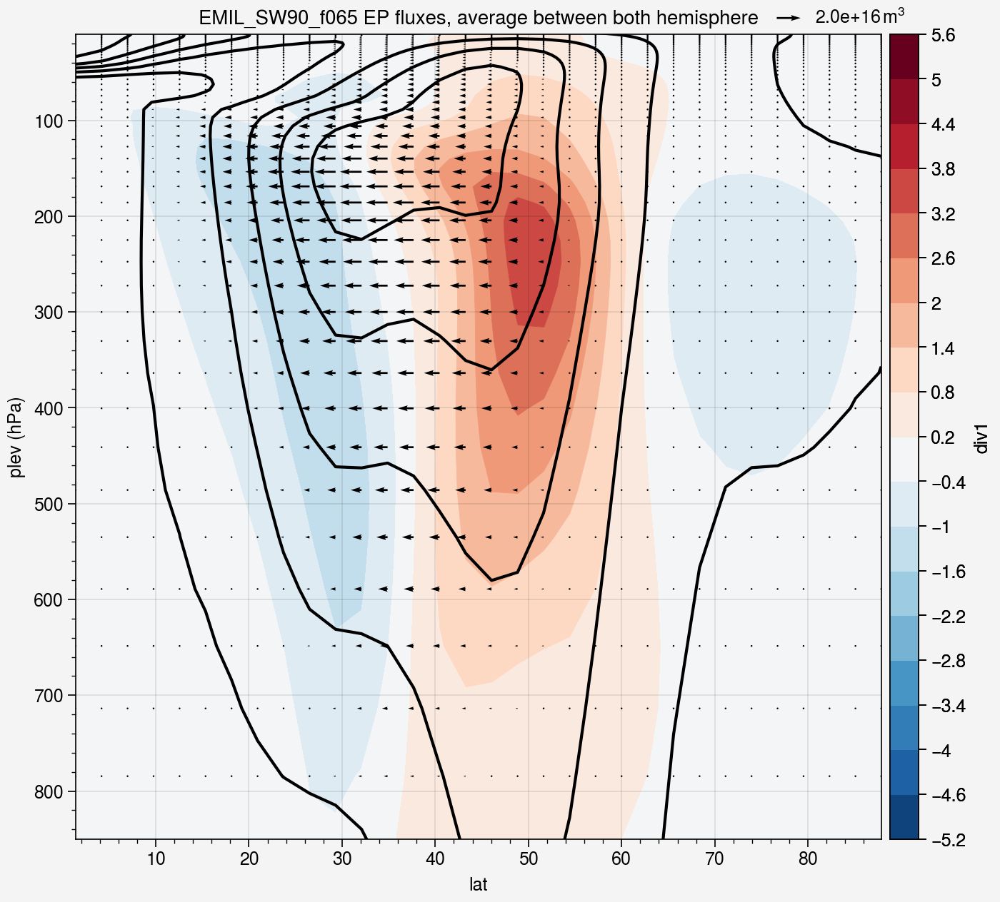

In [141]:
ds = calc_avg_btw_hemispheres(ds_ep_ref.mean('time')) #.isel(time=-5)
ds_wind = calc_avg_btw_hemispheres(ds_zm_ref.mean('time'))
fig, ax = pplt.subplots(figwidth=7)

max_div = np.ceil(np.abs((ds.div1)).sel(plev=slice(0,800)).max().values)
max_div += 0.3 * max_div
d_level = np.round(max_div/8, 1)

ax.contourf(ds.lat, ds.plev, (ds.div1).T, levels=np.arange(-max_div,max_div + d_level, d_level), colorbar='right', extent='both')
ax.contour(ds.lat, ds.plev, ds_wind.um1.T, color='black', levels=10)
f_phi_dx, f_phi_dy = aostools.climate.PlotEPfluxArrows(ds.lat.values, ds.plev.values, ds.ep_cart1.T, ds.ep_cart2.T * 0, fig, ax, scale=2e16)

ax.set_ylim([850,10])
ax.set_title(f'{ref_name} EP fluxes, average between both hemisphere')

fig.savefig(f'{ref_name}_EP_fluxes.{plot_format}')

def plot_ep_flux(ds_ep):
    return

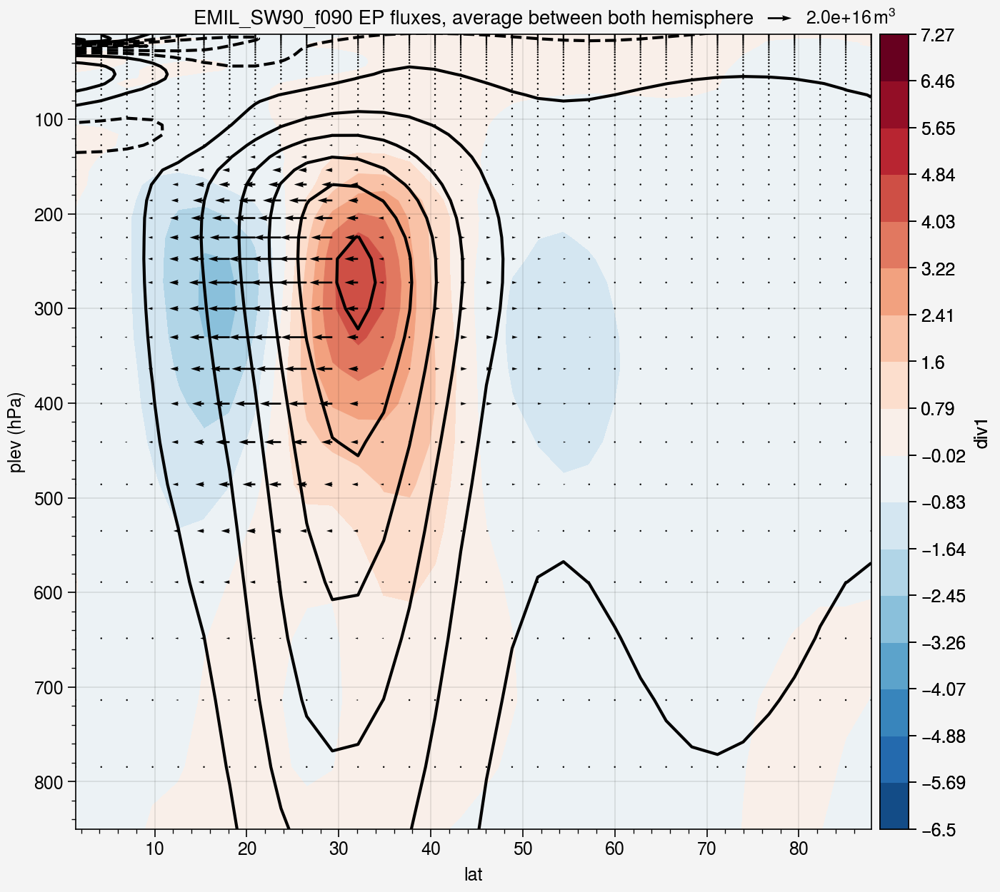

In [142]:
ds = calc_avg_btw_hemispheres(ds_ep.mean('time')) #.isel(time=-5)
ds_wind = calc_avg_btw_hemispheres(ds_zm.mean('time'))
fig, ax = pplt.subplots(figwidth=7)

max_div = np.ceil(np.abs((ds.div1)).sel(plev=slice(0,800)).max().values)
max_div += 0.3 * max_div
d_level = np.round(max_div/8, 2)

ax.contourf(ds.lat, ds.plev, (ds.div1).T, levels=np.arange(-max_div,max_div + d_level, d_level), colorbar='right', extent='both')
ax.contour(ds.lat, ds.plev, ds_wind.um1.T, color='black', levels=10)
f_phi_dx, f_phi_dy = aostools.climate.PlotEPfluxArrows(ds.lat.values, ds.plev.values, ds.ep_cart1.T, ds.ep_cart2.T * 0, fig, ax, scale=2e16)

ax.set_ylim([850,10])
ax.set_title(f'{exp_name} EP fluxes, average between both hemisphere')

fig.savefig(f'{exp_name}_EP_fluxes.{plot_format}')

def plot_ep_flux(ds_ep):
    return

## EP-Flux

MovieWriter ffmpeg unavailable; using Pillow instead.


IndexError: index 181 is out of bounds for axis 0 with size 181

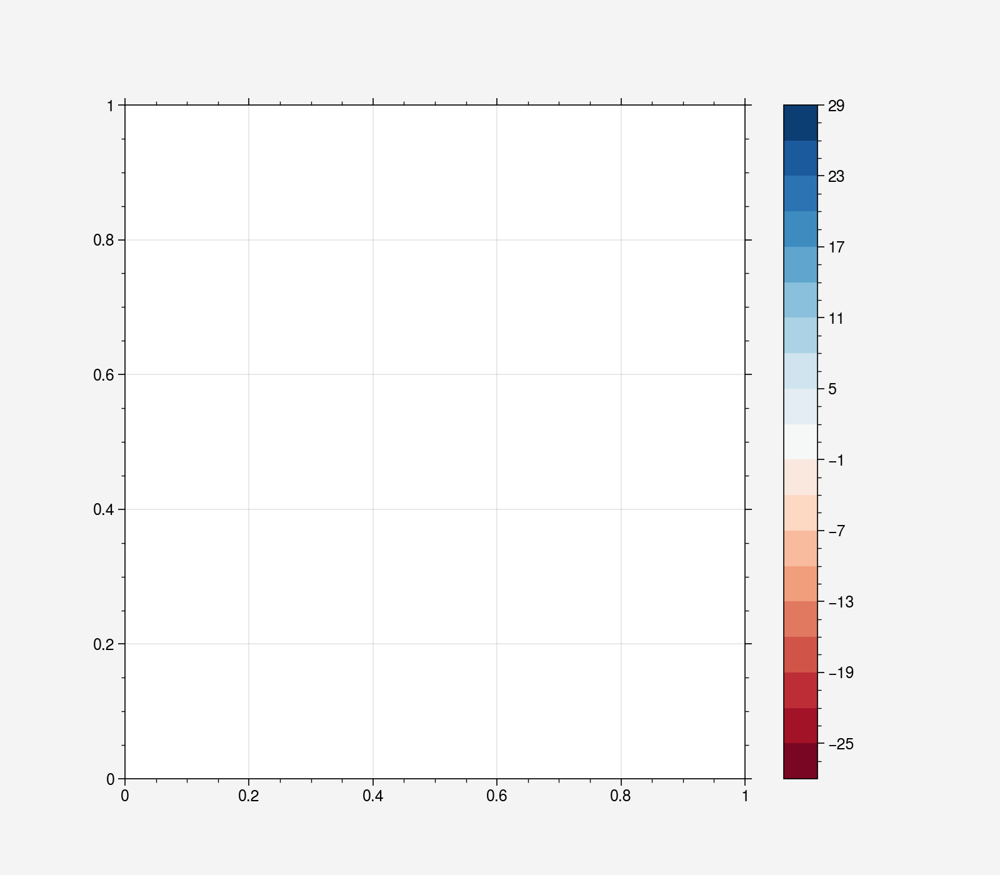

In [72]:
f = 5
trans_date = ds_zm_ref.trans_date.values
start_date = trans_date - np.timedelta64(60, 'D')
end_date = trans_date + np.timedelta64(120, 'D')

ds = ds_ep_ref.sel(lat=slice(90,-5), time=slice(start_date, end_date)).rolling(time=f, center=True, min_periods=1).mean('time')
ds_wind = ds_zm_ref.sel(lat=slice(90,-5), time=slice(start_date, end_date)).rolling(time=f, center=True, min_periods=1).mean('time')

def animate_ep_flux(i, max_div=None):
    
    ax.clear()
    
    ds_sel = ds.isel(time=i)
    ds_wind_sel = ds_wind.isel(time=i)
    
    if max_div is None:
        max_div = np.ceil(np.abs((ds.div1+ds.div2)).sel(plev=slice(0,800)).max().values)
        #max_div += 0.3 * max_div
    d_level = np.round(max_div/10, 0)
    
    cf = ax.contourf(ds_sel.lat, ds_sel.plev, (ds_sel.div1+ds_sel.div2), levels=np.arange(-max_div,max_div + d_level, d_level), cmap='RdBu', extent='both')
    ax.contour(ds_sel.lat, ds_sel.plev, ds_wind_sel.um1, colors='black', levels=10)
    f_phi_dx, f_phi_dy = aostools.climate.PlotEPfluxArrows(ds_sel.lat.values, ds_sel.plev.values, ds_sel.ep_cart1, ds_sel.ep_cart2, fig, ax)
    
    ax.set_ylim([850,10])
    ax.set_xlim([0,90])
    ax.set_title(f'{ref_name} EP fluxes at day {- int(days_before_trans) + i} after the fg switch')
    
    return

fig, ax = plt.subplots(figsize=(8,7))
max_div = np.ceil(np.abs((ds.div1+ds.div2)).sel(plev=slice(0,800)).max().values)
d_level = np.round(max_div/10, 0)
days_before_trans = (ds_wind.trans_date.values - ds_wind.time[0].values).astype('timedelta64[D]')/np.timedelta64(1,'D')

cf = ax.contourf(ds.lat, ds.plev, (ds.div1+ds.div2).mean('time'), levels=np.arange(-max_div,max_div + d_level, d_level), cmap='RdBu', extent='both')
cbar = plt.colorbar(cf)

from matplotlib.animation import FuncAnimation

anime = FuncAnimation(
    fig=fig,
    func=animate_ep_flux,
    frames=ds_ep.time.size-1,
    interval=200,
)

anime.save(f'{ref_name}_ep_evolution.gif')

In [ ]:
f = 5
trans_date = ds_zm.trans_date.values
start_date = trans_date - np.timedelta64(60, 'D')
end_date = trans_date + np.timedelta64(120, 'D')

ds = ds_ep.sel(lat=slice(90,-5), time=slice(start_date, end_date)).rolling(time=f, center=True, min_periods=1).mean('time')
ds_wind = ds_zm.sel(lat=slice(90,-5), time=slice(start_date, end_date)).rolling(time=f, center=True, min_periods=1).mean('time')

def animate_ep_flux(i, max_div=None):
    
    ax.clear()
    
    ds_sel = ds.isel(time=i)
    ds_wind_sel = ds_wind.isel(time=i)
    
    if max_div is None:
        max_div = np.ceil(np.abs((ds.div1+ds.div2)).sel(plev=slice(0,800)).max().values)
        #max_div += 0.3 * max_div
    d_level = np.round(max_div/10, 0)
    
    cf = ax.contourf(ds_sel.lat, ds_sel.plev, (ds_sel.div1+ds_sel.div2), levels=np.arange(-max_div,max_div + d_level, d_level), cmap='RdBu', extent='both')
    ax.contour(ds_sel.lat, ds_sel.plev, ds_wind_sel.um1, colors='black', levels=10)
    f_phi_dx, f_phi_dy = aostools.climate.PlotEPfluxArrows(ds_sel.lat.values, ds_sel.plev.values, ds_sel.ep_cart1, ds_sel.ep_cart2, fig, ax)
    
    ax.set_ylim([850,10])
    ax.set_xlim([0,90])
    ax.set_title(f'{exp_name} EP fluxes at day {- int(days_before_trans) + i} after the fg switch')
    print(ds.time[i].values)
    
    return

fig, ax = plt.subplots(figsize=(8,7))
max_div = np.ceil(np.abs((ds.div1+ds.div2)).sel(plev=slice(0,800)).max().values)
d_level = np.round(max_div/10, 0)
days_before_trans = (ds_wind.trans_date.values - ds_wind.time[0].values).astype('timedelta64[D]')/np.timedelta64(1,'D')

cf = ax.contourf(ds.lat, ds.plev, (ds.div1+ds.div2).mean('time'), levels=np.arange(-max_div,max_div + d_level, d_level), cmap='RdBu', extent='both')
cbar = plt.colorbar(cf)

from matplotlib.animation import FuncAnimation

anime = FuncAnimation(
    fig=fig,
    func=animate_ep_flux,
    frames=ds.time.size,
    interval=200,
)

anime.save(f'{exp_name}_ep_evolution.gif')

In [ ]:
def plot_ep_flux(ds, ds_wind):
    
    fig, ax = pplt.subplots(figwidth=7)

    if max_div is None:
        max_div = np.ceil(np.abs((ds.div1+ds.div2)).sel(plev=slice(0,800)).max().values)
        max_div += 0.3 * max_div
    d_level = np.round(max_div/8, 2)
    
    ax.contourf(ds.lat, ds.plev, (ds.div2).T, levels=np.arange(-max_div,max_div + d_level, d_level), colorbar='right', extent='both')
    ax.contour(ds.lat, ds.plev, ds_wind.um1.T, color='black', levels=10)
    f_phi_dx, f_phi_dy = aostools.climate.PlotEPfluxArrows(ds.lat.values, ds.plev.values, ds.ep_cart1.T, ds.ep_cart2.T, fig, ax)
    
    ax.set_ylim([850,10])

    return fig, ax

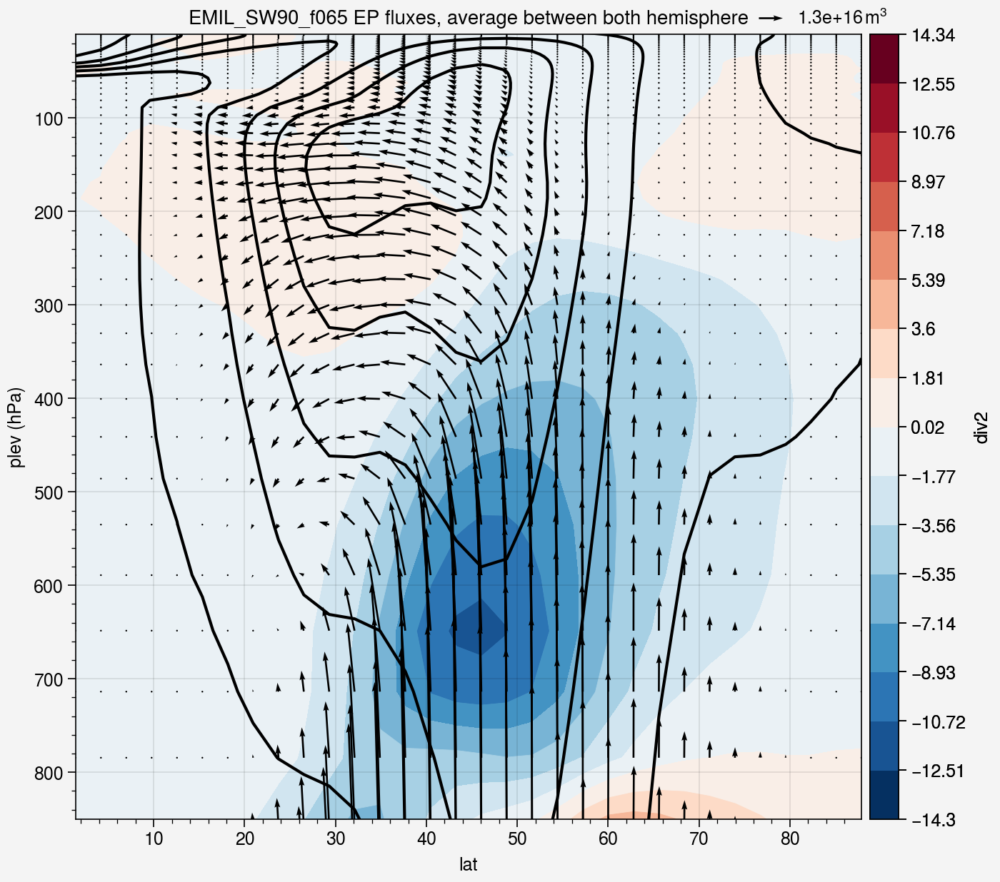

In [143]:
fig, ax = plot_ep_flux(calc_avg_btw_hemispheres(ds_ep_ref.mean('time')), calc_avg_btw_hemispheres(ds_zm_ref.mean('time')))
ax.set_title(f'{ref_name} EP fluxes, average between both hemisphere')

fig.savefig(f'{ref_name}_EP_fluxes.{plot_format}')

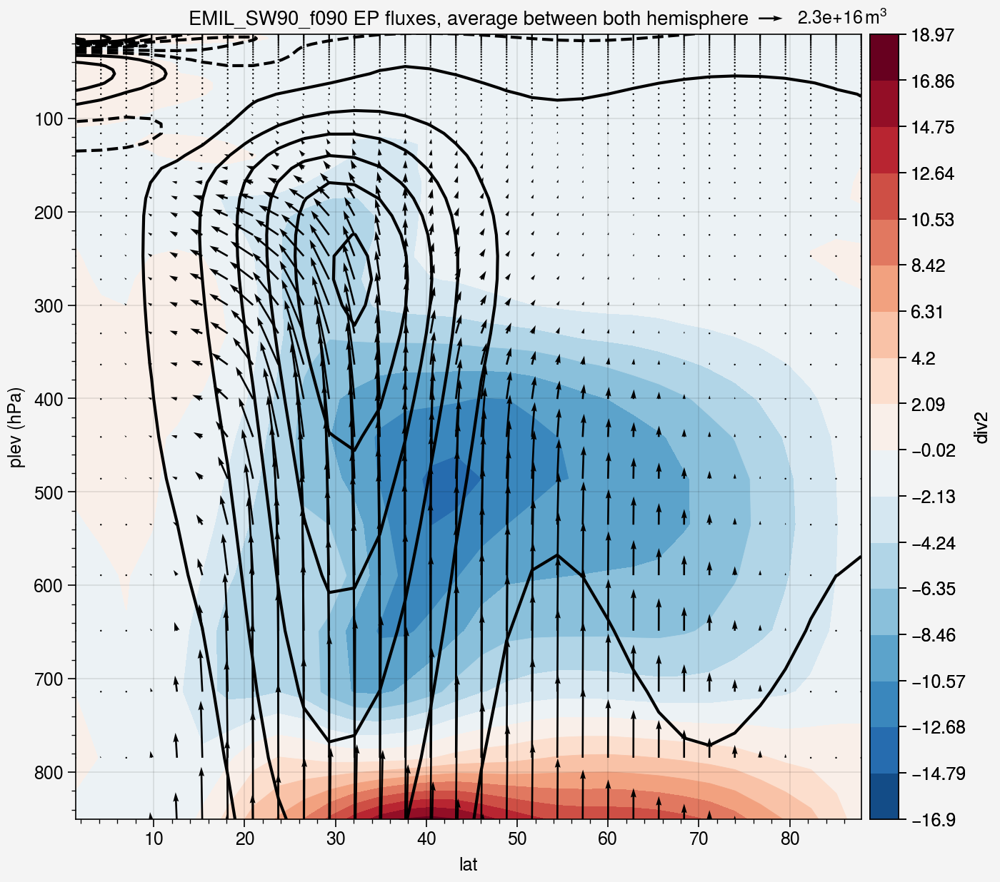

In [144]:
fig, ax = plot_ep_flux(calc_avg_btw_hemispheres(ds_ep.mean('time')), calc_avg_btw_hemispheres(ds_zm.mean('time')))
ax.set_title(f'{exp_name} EP fluxes, average between both hemisphere')

fig.savefig(f'{exp_name}_EP_fluxes.{plot_format}')

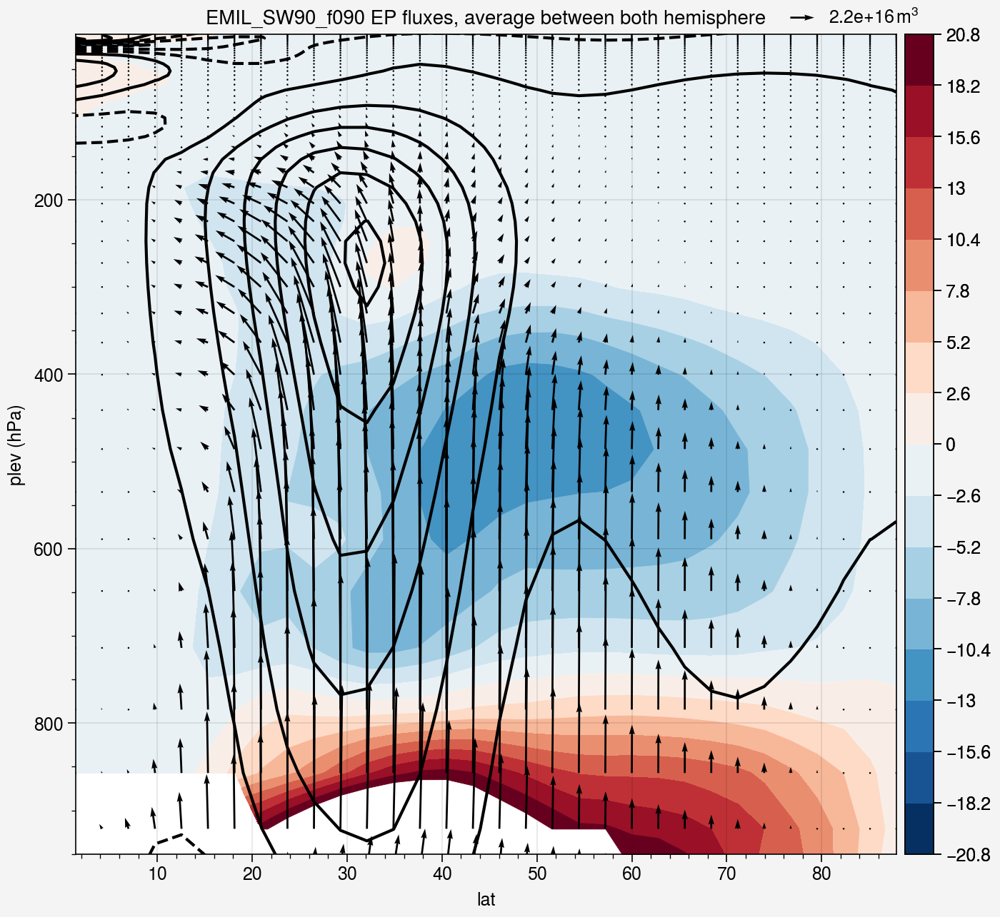

In [123]:
ds = calc_avg_btw_hemispheres(ds_ep.mean('time')) #.isel(time=-5)
ds_wind = calc_avg_btw_hemispheres(ds_zm.mean('time'))

fig, ax = pplt.subplots(figwidth=7)

max_div = np.ceil(np.abs((ds.div1+ds.div2)).sel(plev=slice(0,800)).max().values)
max_div += 0.6 * max_div
d_level = np.round(max_div/8, 2)

ax.contourf(ds.lat, ds.plev, (ds.div1+ds.div2).T, levels=np.arange(-max_div,max_div + d_level, d_level), colorbar='right', extent='both')
ax.contour(ds.lat, ds.plev, ds_wind.um1.T, color='black', levels=10)
f_phi_dx, f_phi_dy = aostools.climate.PlotEPfluxArrows(ds.lat.values, ds.plev.values, ds.ep_cart1.T, ds.ep_cart2.T, fig, ax)

ax.set_ylim([950,10])
ax.set_title(f'{exp_name} EP fluxes, average between both hemisphere')
fig.savefig(f'{exp_name}_EP_fluxes.{plot_format}')

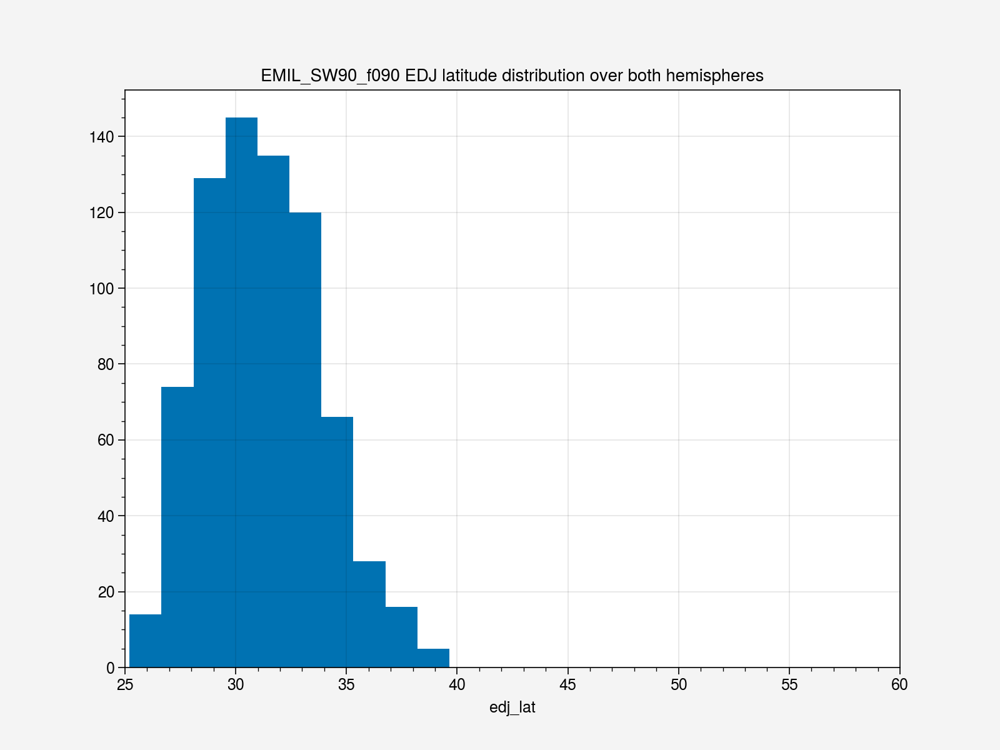

In [134]:
np.abs(ds_js.edj_lat).plot.hist()
plt.title(f'{exp_name} EDJ latitude distribution over both hemispheres')
plt.xlim([25,60])
plt.savefig(f'{exp_name}_edj_hist.{plot_format}')

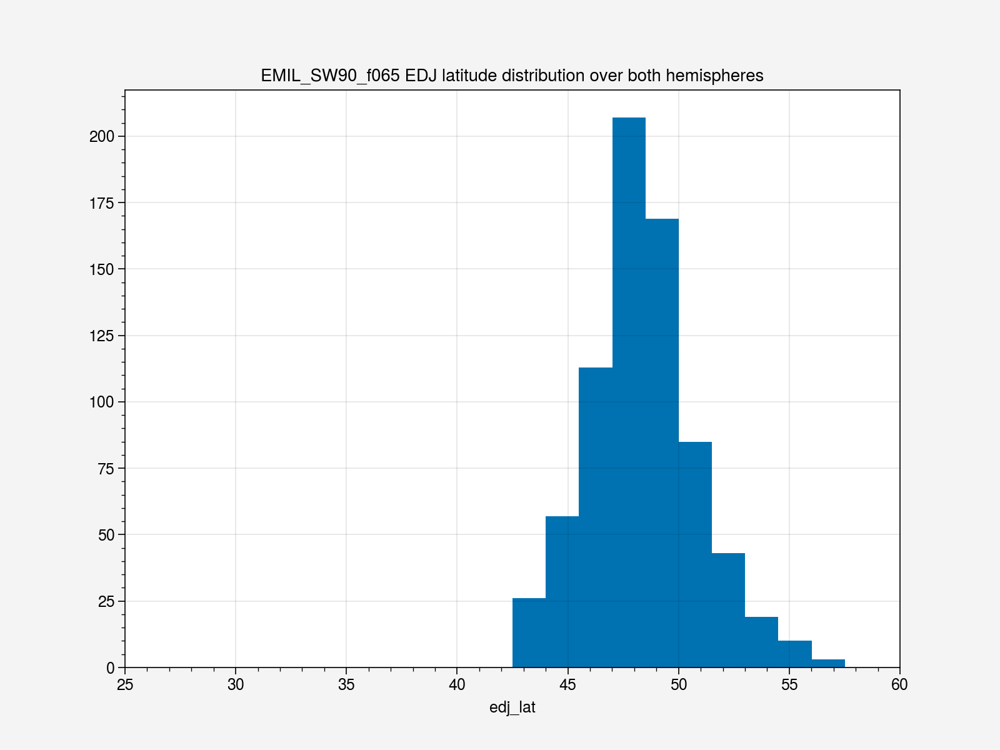

In [135]:
np.abs(ds_js_ref.edj_lat).plot.hist()
plt.title(f'{ref_name} EDJ latitude distribution over both hemispheres')
plt.xlim([25,60])
plt.savefig(f'{ref_name}_edj_hist.{plot_format}')

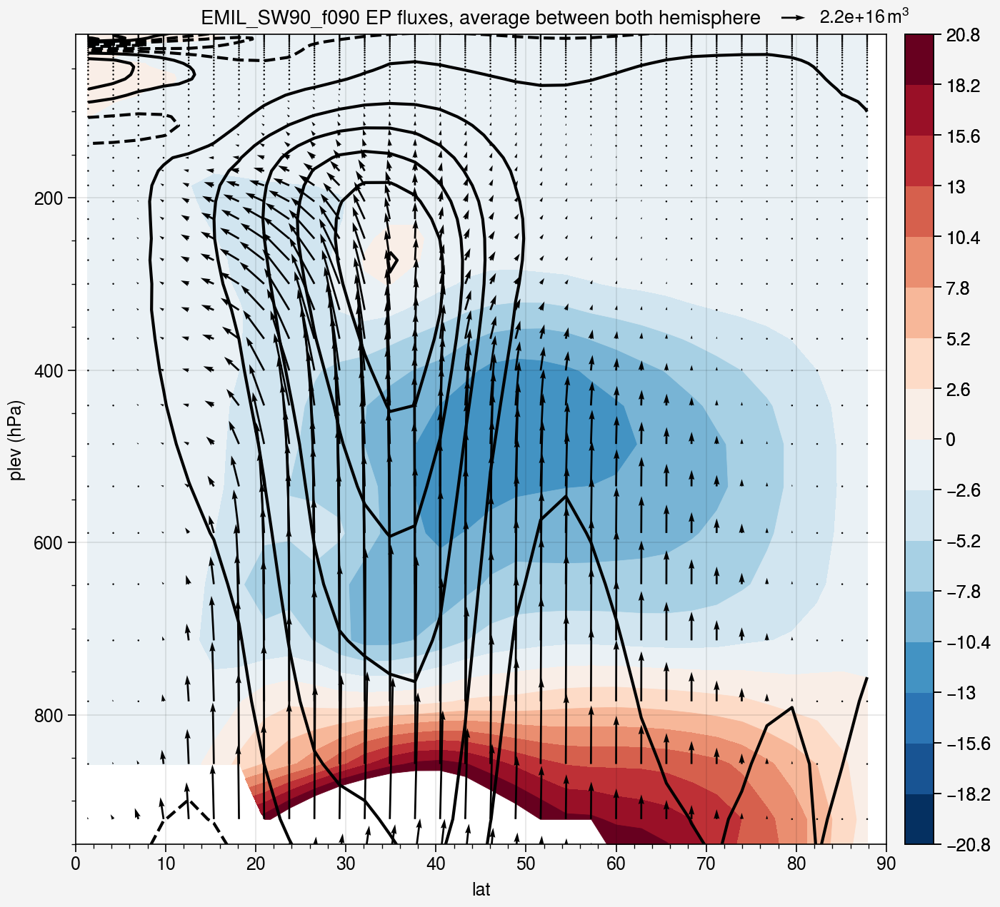

In [139]:
ds = calc_avg_btw_hemispheres(ds_ep.mean('time')) #.isel(time=-5)
time_sel = ds_js.time.where(ds_js.sel(hemisphere='NH').edj_lat > 37, drop=True)
ds_wind = ds_zm.sel(lat=slice(90,0), time=time_sel).mean('time')

fig, ax = pplt.subplots(figwidth=7)

max_div = np.ceil(np.abs((ds.div1+ds.div2)).sel(plev=slice(0,800)).max().values)
max_div += 0.6 * max_div
d_level = np.round(max_div/8, 2)

ax.contourf(ds.lat, ds.plev, (ds.div1+ds.div2).T, levels=np.arange(-max_div,max_div + d_level, d_level), colorbar='right', extent='both')
ax.contour(ds_wind.lat, ds_wind.plev, ds_wind.um1, color='black', levels=10)
f_phi_dx, f_phi_dy = aostools.climate.PlotEPfluxArrows(ds.lat.values, ds.plev.values, ds.ep_cart1.T, ds.ep_cart2.T, fig, ax)

ax.set_ylim([950,10])
ax.set_xlim([0,90])
ax.set_title(f'{exp_name} EP fluxes, average between both hemisphere')
fig.savefig(f'{exp_name}_EP_fluxes.{plot_format}')

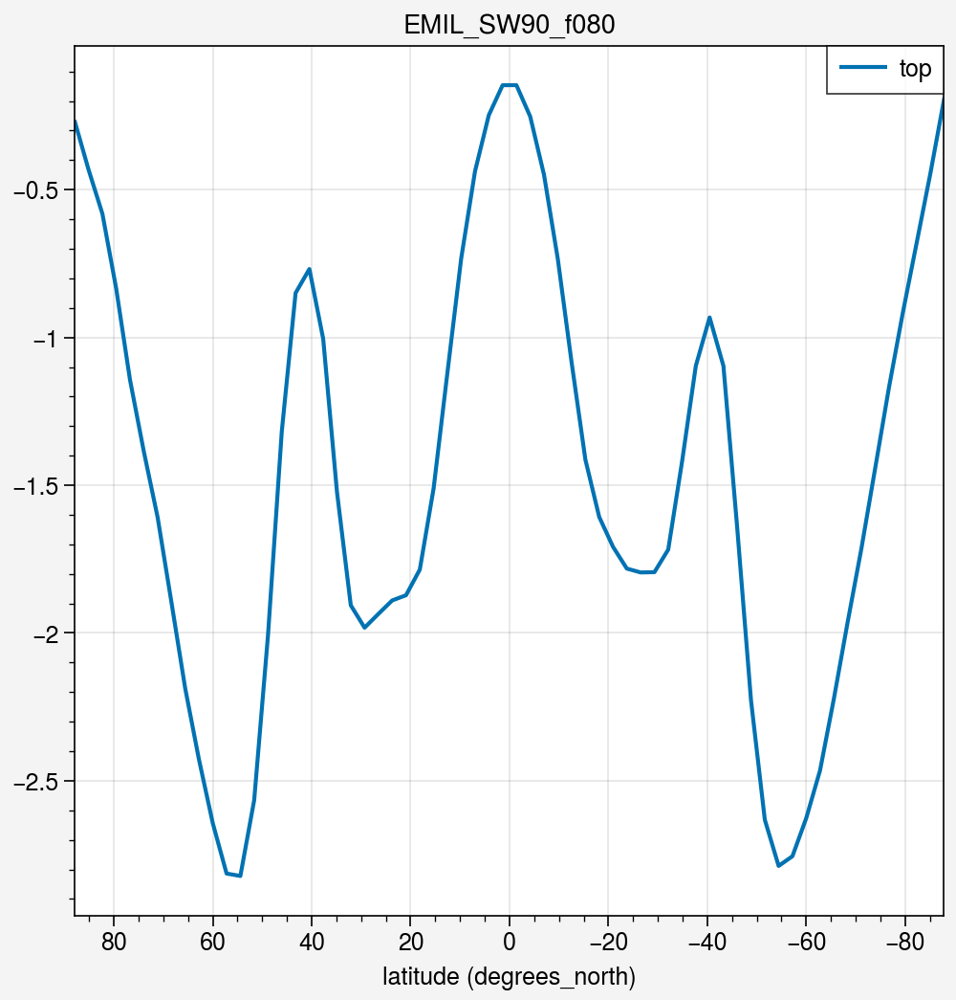

In [35]:
fig, ax = pplt.subplots(figwidth=5)

ep_div = (ds_ep_ref.div1 + ds_ep_ref.div2).mean('time')
ep_div_top = ep_div.sel(plev=slice(100,400)).weighted(vertical_weights(ds_ep.plev)).mean('plev')
ep_div_bot = ep_div.sel(plev=slice(800,900)).weighted(vertical_weights(ds_ep.plev)).mean('plev')

ax.plot(ep_div_top, label='top')
#ax.plot(ep_div_bot, label='bottom')

ax.legend()
ax.set_title(f'{ref_name}') #EP fluxes, averaged between 900  & 800, and 700 & 50 hPa')
fig.savefig(f'{ref_name}_integrated_EP_fluxes.{plot_format}')

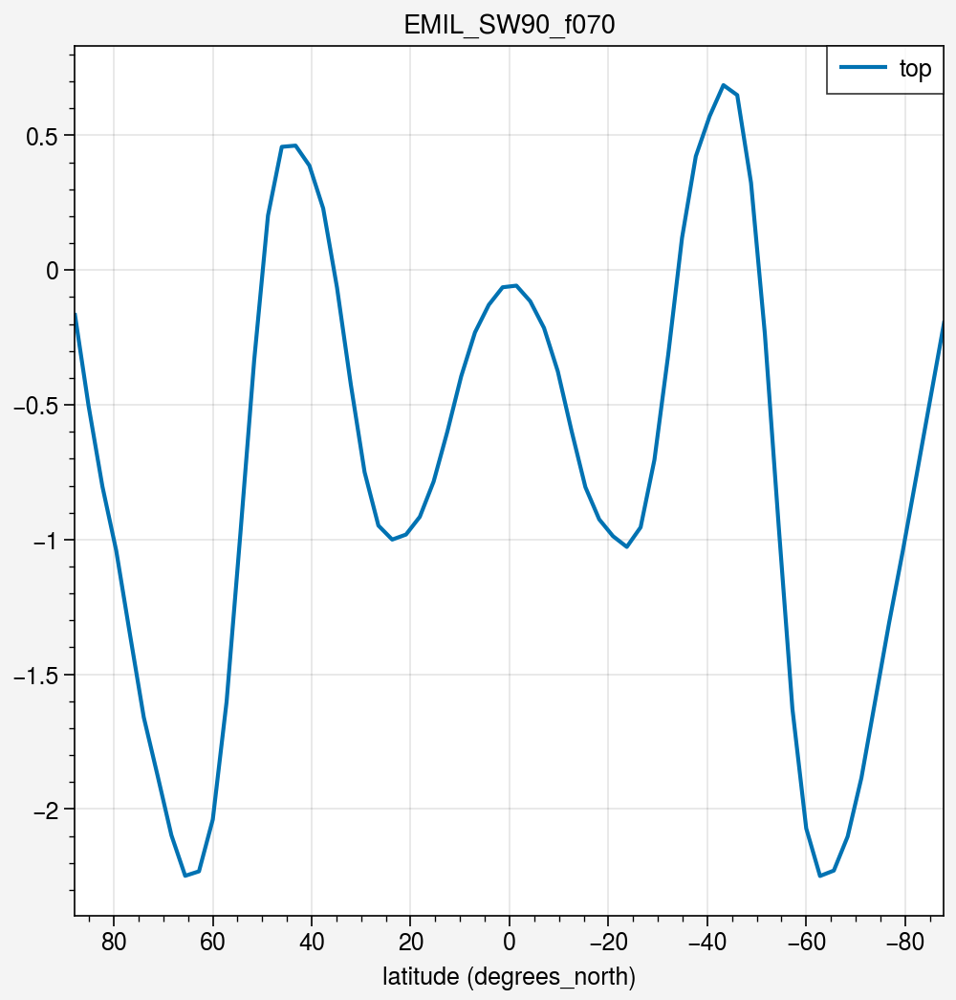

In [34]:
fig, ax = pplt.subplots(figwidth=5)

ep_div = (ds_ep.div1 + ds_ep.div2).mean('time')
ep_div_top = ep_div.sel(plev=slice(100,400)).weighted(vertical_weights(ds_ep.plev)).mean('plev')
ep_div_bot = ep_div.sel(plev=slice(800,900)).weighted(vertical_weights(ds_ep.plev)).mean('plev')

ax.plot(ep_div_top, label='top')
#ax.plot(ep_div_bot, label='bottom')

ax.legend()
ax.set_title(f'{exp_name}') # EP flux divergence, averaged between 900  & 800, and 700 & 50 hPa')
fig.savefig(f'{exp_name}_integrated_EP_fluxes.{plot_format}')

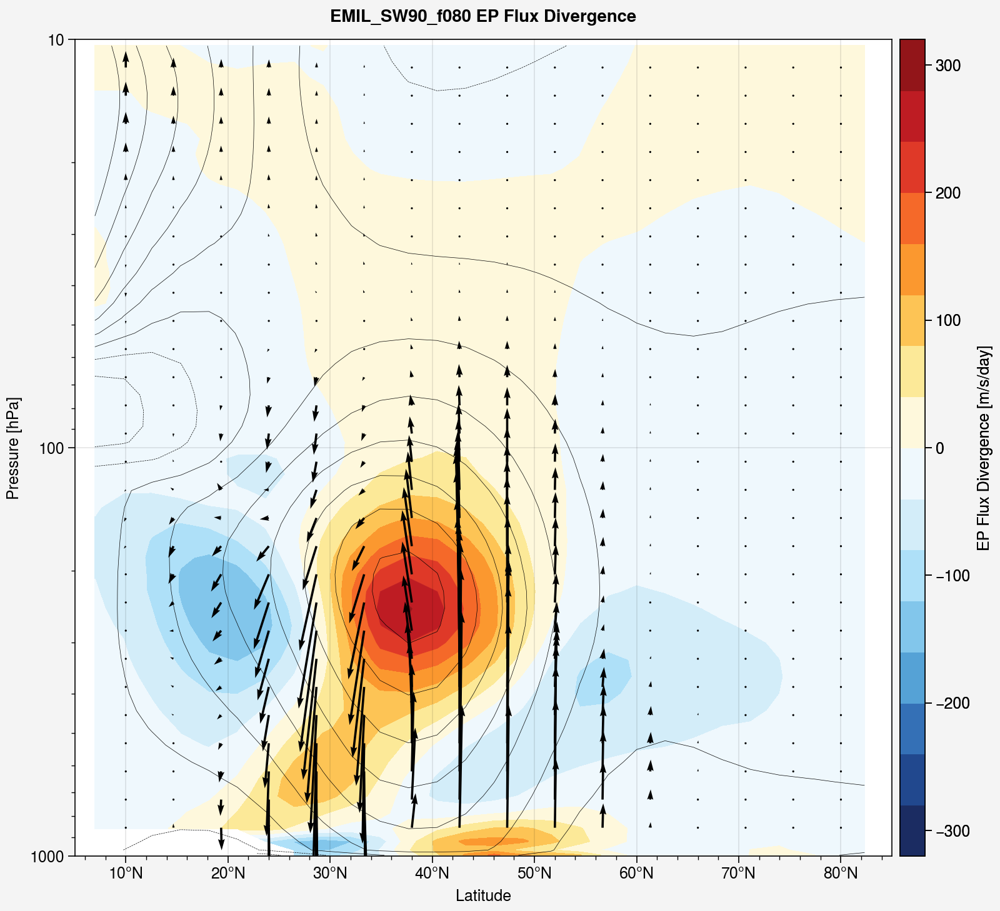

In [14]:
def plot_ep_flux_div(ds_transports, ds_zonalmean):

    omega = 2 * np.pi / (24 * 60 * 60)
    g = 9.81
    a = 6370000
    K = 2 / 7
    aspect_x = 1
    aspect_y = 1
    delta_phi = 85
    p_min, p_max = (10, 1000)
    lat_min, lat_max = (5, 85)
    
    p_equ = 10 ** np.linspace(np.log10(p_min), np.log10(p_max), 30)
    lat_grid = np.linspace(80, 10, 16)
    
    # fluxes ohne cosinus -> rausrechnen 
    cos_lat = np.cos(np.radians(ds_transports.lat))
    
    uv = (ds_transports.vu_et).sel(plev=slice(p_min,p_max), lat=slice(lat_max,lat_min)).mean('time')/cos_lat
    #uw = (ds_transports.wu_et).sel(plev=slice(p_min,p_max), lat=slice(lat_max,lat_min)).mean('time')/100 /cos_lat # [Pa/s] auf  [hPa/s]
    vt = (ds_transports.vT_et).sel(plev=slice(p_min,p_max), lat=slice(lat_max,lat_min)).mean('time')/cos_lat
    u = ds_zonalmean.um1.sel(plev=slice(p_min,p_max), lat=slice(lat_max,lat_min)).mean('time')
    t = ds_zonalmean.tm1.sel(plev=slice(p_min,p_max), lat=slice(lat_max,lat_min)).mean('time')

    chi = vt / (t.differentiate("plev") - (K * t / t.plev))

    f_phi = (chi * u.differentiate("plev")) - uv 
    f_p = (
         chi
         * (
             (2 * omega * np.sin(np.deg2rad(t.lat)))
             - (
                 calc_da_derivative((u * np.cos(np.deg2rad(u.lat))), np.radians(u.lat))
                 * 180
                 / np.pi
                 / np.cos(np.deg2rad(t.lat))
                 / a
             )
         )
    ) #- uw

    F_phi = a * np.cos(np.deg2rad(f_phi.lat)) * f_phi 
    F_p = a * np.cos(np.deg2rad(f_p.lat)) * f_p

    ep_flux_phi = (
         2 * np.pi * a ** 2 * np.cos(np.deg2rad(f_phi.lat)) ** 2 * f_phi / g
    ).transpose()
    ep_flux_p = (
         2 * np.pi * a ** 3 * np.cos(np.deg2rad(f_p.lat)) ** 2 * f_p / g
    ).transpose()

    ep_div = (
         (
             calc_da_derivative((F_phi * np.cos(np.deg2rad(F_phi.lat))), np.radians(F_phi.lat), coord_name='lat').T
             * 180
             / np.pi
             / a
             / np.cos(np.deg2rad(F_phi.lat))
         )
         + (F_p.differentiate("plev"))
    ).transpose()
    
    ep_flux_phi_plot = (ep_flux_phi * aspect_x * 180 / aspect_y / delta_phi / np.pi).interp(
         plev=p_equ, lat=lat_grid
    )
    ep_flux_p_plot = (ep_flux_p / ep_flux_p.plev / np.log(p_min / p_max)).interp(
         plev=p_equ, lat=lat_grid
    )


    fig, ax = pplt.subplots(figwidth=8)  # aspect=(aspect_y/aspect_x),
    ax.contour(u, color="black", lw=0.25) 
    ax.contourf(
         24 * 3600 * ep_div / a / np.cos(np.deg2rad(ep_div.lat)),
         levels=16, #np.arange(-40,40.1,10),
         cmap="ColdHot",
         norm="diverging",
         symmetric=True,
         colorbar="r",
         colorbar_kw={"ticks": "auto", "label": "EP Flux Divergence [m/s/day]"},
    )
    ax.quiver(
         ep_flux_phi_plot,
         ep_flux_p_plot,
         pivot="tail",
         units="xy",
         angles="uv",
    )
    ax.format(
         xlabel="Latitude",
         xformatter="deglat",
         ylabel="Pressure [hPa]",
         ylim=(p_min, p_max),
         yscale="log",
         yreverse=True,
         xlim=(5,85),
    )
    return fig, ax

fig, ax = plot_ep_flux_div(ds_tp, ds_zm)

fig.suptitle(f'{exp_name} EP Flux Divergence')
fig.savefig(f'{exp_name}_ep_flux_div.{plot_format}')

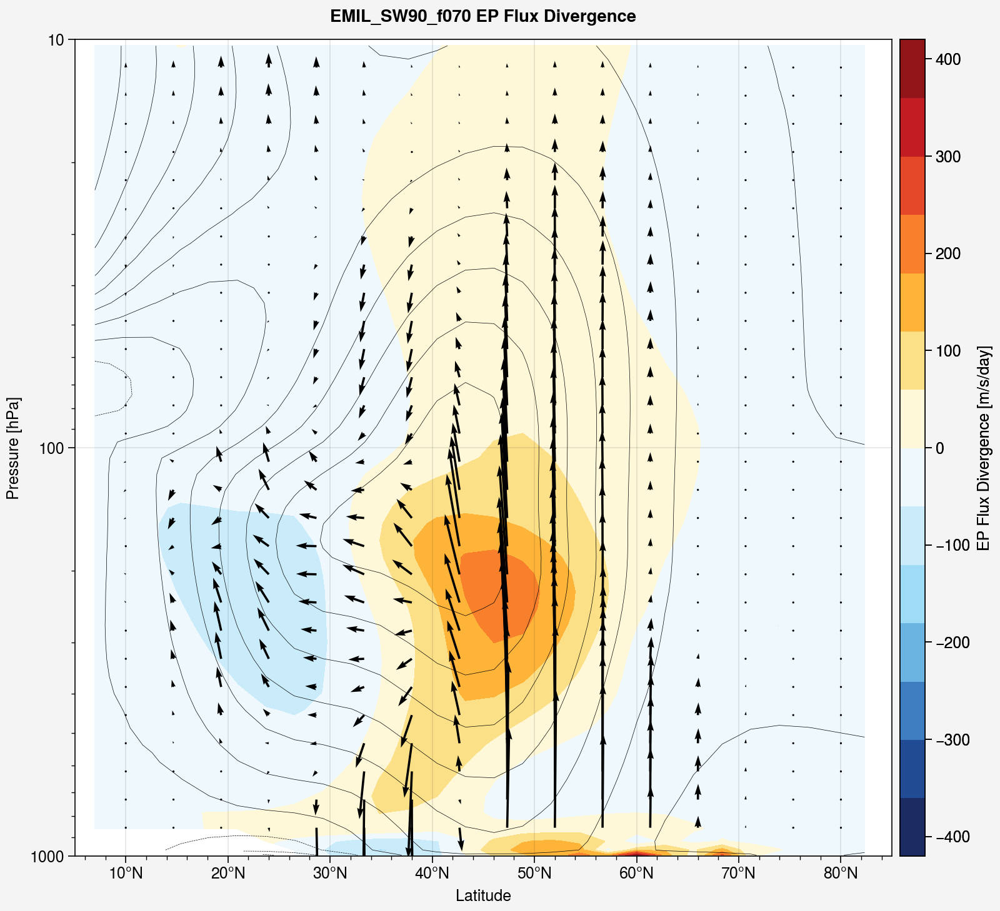

In [15]:
fig, ax = plot_ep_flux_div(ds_tp_ref, ds_zm_ref)

fig.suptitle(f'{ref_name} EP Flux Divergence')
fig.savefig(f'{ref_name}_ep_flux_div.{plot_format}')

In [37]:
ds_transports = ds_tp
ds_zonalmean = ds_zm

omega = 2 * np.pi / (24 * 60 * 60)
g = 9.81
a = 6370000
K = 2 / 7
aspect_x = 1
aspect_y = 1
delta_phi = 85
p_min, p_max = (10, 1000)
lat_min, lat_max = (5, 85)

p_equ = 10 ** np.linspace(np.log10(p_min), np.log10(p_max), 25)
lat_grid = np.linspace(80, 10, 8)

# fluxes ohne cosinus -> rausrechnen 
cos_lat = np.cos(np.radians(ds_transports.lat))

uv = (ds_transports.vu_et).sel(plev=slice(p_min,p_max), lat=slice(lat_max,lat_min)).mean('time')/cos_lat
uw = (ds_transports.wu_et).sel(plev=slice(p_min,p_max), lat=slice(lat_max,lat_min)).mean('time')/cos_lat/100 # [Pa/s] auf  [hPa/s]
vt = (ds_transports.vT_et).sel(plev=slice(p_min,p_max), lat=slice(lat_max,lat_min)).mean('time')/cos_lat
u = ds_zonalmean.um1.sel(plev=slice(p_min,p_max), lat=slice(lat_max,lat_min)).mean('time')
t = ds_zonalmean.tm1.sel(plev=slice(p_min,p_max), lat=slice(lat_max,lat_min)).mean('time')

chi = vt / (t.differentiate("plev") - (K * t / t.plev))


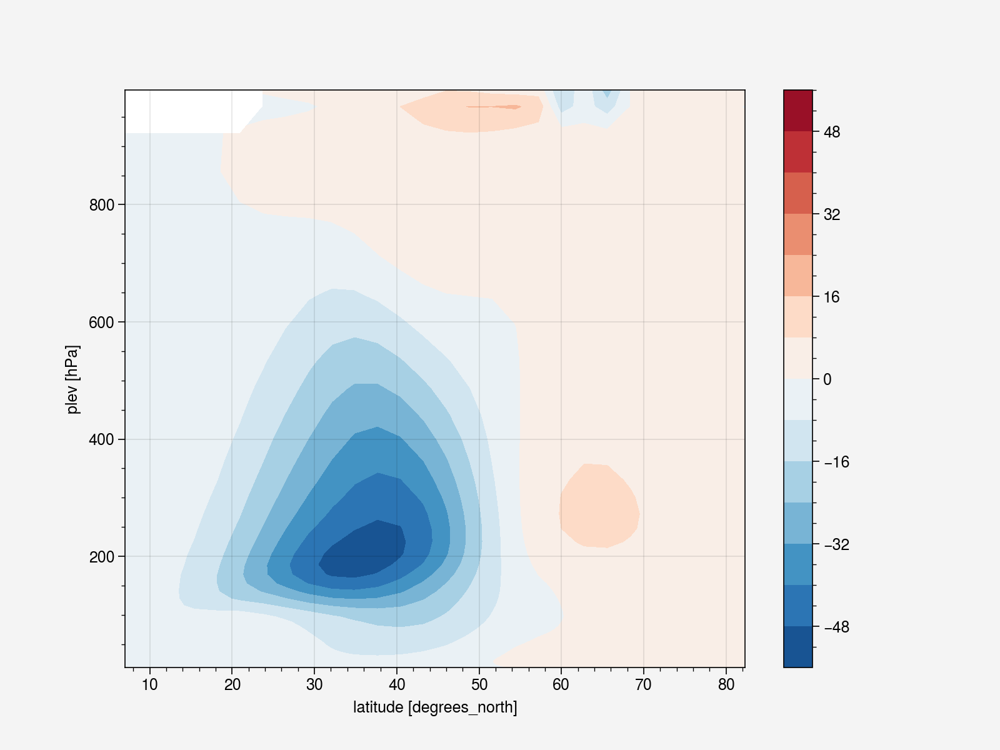

In [38]:
f_phi = (chi * u.differentiate("plev")) - uv 
f_p = (
     chi
     * (
         (2 * omega * np.sin(np.deg2rad(t.lat)))
         - (
             (u * np.cos(np.deg2rad(u.lat))).differentiate("lat")
             * 180
             / np.pi
             / np.cos(np.deg2rad(t.lat))
             / a
         )
     )
) - uw
f_phi.plot.contourf(levels=16)
plt.savefig(f'{exp_name}_dy_uvet.{plot_format}')

In [39]:
ds_transports = ds_tp_ref
ds_zonalmean = ds_zm_ref

omega = 2 * np.pi / (24 * 60 * 60)
g = 9.81
a = 6370000
K = 2 / 7
aspect_x = 1
aspect_y = 1
delta_phi = 85
p_min, p_max = (10, 1000)
lat_min, lat_max = (5, 85)

p_equ = 10 ** np.linspace(np.log10(p_min), np.log10(p_max), 25)
lat_grid = np.linspace(80, 10, 8)

# fluxes ohne cosinus -> rausrechnen 
cos_lat = np.cos(np.radians(ds_transports.lat))

uv = (ds_transports.vu_et).sel(plev=slice(p_min,p_max), lat=slice(lat_max,lat_min)).mean('time')/cos_lat
uw = (ds_transports.wu_et).sel(plev=slice(p_min,p_max), lat=slice(lat_max,lat_min)).mean('time')/cos_lat/100 # [Pa/s] auf  [hPa/s]
vt = (ds_transports.vT_et).sel(plev=slice(p_min,p_max), lat=slice(lat_max,lat_min)).mean('time')/cos_lat
u = ds_zonalmean.um1.sel(plev=slice(p_min,p_max), lat=slice(lat_max,lat_min)).mean('time')
t = ds_zonalmean.tm1.sel(plev=slice(p_min,p_max), lat=slice(lat_max,lat_min)).mean('time')

chi = vt / (t.differentiate("plev") - (K * t / t.plev))


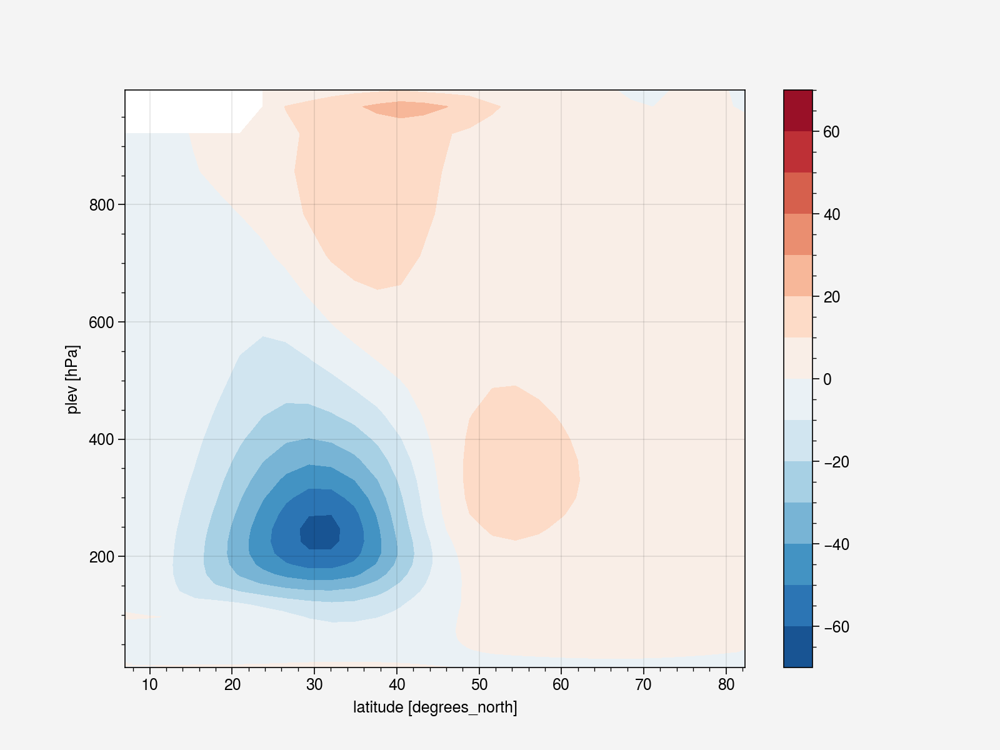

In [40]:
f_phi = (chi * u.differentiate("plev")) - uv 
f_p = (
     chi
     * (
         (2 * omega * np.sin(np.deg2rad(t.lat)))
         - (
             (u * np.cos(np.deg2rad(u.lat))).differentiate("lat")
             * 180
             / np.pi
             / np.cos(np.deg2rad(t.lat))
             / a
         )
     )
) - uw
f_phi.plot.contourf(levels=16)
plt.savefig(f'{ref_name}_dy_uvet.{plot_format}')

In [ ]:
F_phi = a * np.cos(np.deg2rad(f_phi.lat)) * f_phi 
F_p = a * np.cos(np.deg2rad(f_p.lat)) * f_p

ep_flux_phi = (
     2 * np.pi * a ** 2 * np.cos(np.deg2rad(f_phi.lat)) ** 2 * f_phi / g
).transpose()
ep_flux_p = (
     2 * np.pi * a ** 3 * np.cos(np.deg2rad(f_p.lat)) ** 2 * f_p / g
).transpose()

ep_div = (
     (
         calc_da_derivative((F_phi * np.cos(np.deg2rad(F_phi.lat))), np.radians(F_phi.lat), coord_name='lat').T
         * 180
         / np.pi
         / a
         / np.cos(np.deg2rad(F_phi.lat))
     )
     + (F_p.differentiate("plev"))
).transpose()

ep_flux_phi_plot = (ep_flux_phi * aspect_x * 180 / aspect_y / delta_phi / np.pi).interp(
     plev=p_equ, lat=lat_grid
)
ep_flux_p_plot = (ep_flux_p / ep_flux_p.plev / np.log(p_min / p_max)).interp(
     plev=p_equ, lat=lat_grid
)


fig, ax = pplt.subplots(figwidth=8)  # aspect=(aspect_y/aspect_x),
ax.contour(u, color="black", lw=0.25) 
ax.contourf(
     24 * 3600 * ep_div / a / np.cos(np.deg2rad(ep_div.lat)),
     levels=16, #np.arange(-40,40.1,10),
     cmap="ColdHot",
     norm="diverging",
     symmetric=True,
     colorbar="r",
     colorbar_kw={"ticks": "auto", "label": "EP Flux Divergence [m/s/day]"},
)
ax.quiver(
     ep_flux_phi_plot,
     ep_flux_p_plot,
     pivot="tail",
     units="xy",
     angles="uv",
)
ax.format(
     xlabel="Latitude",
     xformatter="deglat",
     ylabel="Pressure [hPa]",
     ylim=(p_min, p_max),
     yscale="log",
     yreverse=True,
     xlim=(5,85),
)

In [ ]:
ds_tp

In [ ]:
fig, ax = pplt.subplots()
ax.contourf(ds_tp.plev.values, ds_tp.lat.values, epf_div)

In [ ]:
epf_y

## Convergence


In [ ]:
def convergence_time_means(ts):
    ts_conv = [np.mean(ts[:i]) for i in np.arange(1,ts.size, 1)]
    return ts_conv - ts_conv[-1]

lon = 50
lat = 45
plev = 800
var = 'tm1'

ts_conv_t = convergence_time_means(ds_pls[var].sel(lat=lat, lon=lon, plev=plev, method='nearest').values)
fig, ax = pplt.subplots(figsize=(12,4))
ax.plot(ds_pls.time[1:], ts_conv_t)
ax.set_title(f'cumulative time means minus total time mean over {var} at {lat}°N, {lon}°W, and {plev}')

In [ ]:

n_samples = 100
lat, lon, plev = np.random.randint(np.array([ds_pls.lat.size, ds_pls.lon.size, ds_pls.plev.size]), size=(n_samples, 3)).T

fig, ax = pplt.subplots(figsize=(12,8), nrows=2)

for j in range(n_samples):

    sel = ds_pls[var].isel(lat=lat[j], lon=lon[j], plev=plev[j]).values
    ts_conv_t = convergence_time_means(sel)
    ax[0].plot(ds_pls.time[1:], ts_conv_t)
    ax[1].plot(ds_pls.time[1:], sel[1:] - sel[-1])
    
ax[0].set_title(f'cumulative time means normalized to last value of temperature at various locations')
ax[1].set_title(f'time evolution of temperature at various locations')
fig.savefig(f'{exp_name}_convergence.{plot_format}')

In [ ]:
R = 287.0 # J kg^-1 K^-1
t_i = (ds_zm.tm1.isel(plev=slice(1,ds_zm.plev.size)) + ds_zm.tm1.isel(plev=slice(0,ds_zm.plev.size-1)).values)/2
p_i = (ds_zm.plev.isel(plev=slice(1,ds_zm.plev.size)) + ds_zm.plev.isel(plev=slice(0,ds_zm.plev.size-1)).values)/2
dp = ds_zm.plev.values[:-1] - ds_zm.plev[1:]
gp = (- R*t_i/p_i * dp).reindex(plev=ds_zm.plev[::-1]).cumsum(dim='plev').reindex(plev=ds_zm.plev)

ylims=[1013,1]
fig, ax = pplt.subplots()
ax.contour(gp.sel(plev=slice(100,1000)).mean('time'), colorbar='right')
ax.set_ylim(ylims)

In [ ]:
fig, ax = pplt.subplots()
ax.contour((ds_zm.geopot_p.sel(plev=slice(100,1000))/9.81).mean('time'), colorbar='right')
ax.set_ylim(ylims)

In [ ]:
fig, ax = pplt.subplots()
ax.contourf(gp.sel(plev=slice(100,1000)).mean('time') - ds_zm.sel(plev=slice(100,1000)).geopot_p.mean('time'), colorbar='right', contours=15)
ax.set_ylim(ylims)

In [ ]:
ds = ds_pls.sel(plev=ds_pls.plev[-1], lat=slice(25,0)).resample(time='1W').mean('time')
n = 10
fig, ax = pplt.subplots(figsize=(5,30), nrows=n)

for i in range(10):
    ax[i].contourf(ds.lon, ds.lat, ds.tm1.isel(time=i), colorbar='r')

In [ ]:
ds = ds_zm
ds2 = ds_zm_ref #.sel(time=slice('2000-01-01', '2001-12-29'))

ds.tm1.weighted(total_weights).mean(['lat', 'plev']).plot(label=f'{exp_name}')
plt.plot(ds.time, ds2.tm1.weighted(total_weights).mean(['lat', 'plev']), linestyle= '--', label=f'{ref_name}')
plt.hlines(t_equ.weighted(total_weights).mean(), xmin=ds.time[0], xmax=ds.time[-1], color='dark orange', label=f'T_equ {setup}')
plt.hlines(t_equ_ref.weighted(total_weights).mean(), xmin=ds.time[0], xmax=ds.time[-1], color='dark blue', label=f'T_equ {setup_ref}')
plt.title('global mean temperature')
plt.legend()
plt.savefig(f'{ref_name}_evolution_global_mean_temperature.{plot_format}')

In [60]:
fig, ax = pplt.subplots(nrows=3, ncols=2, figwidth=8)
fgs = [0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
t_levels = np.arange(200, 350.1, 10)

for i,a in enumerate(ax):
    da = relax_moist_adiabat(t_equ, fg=fgs[i])
    a.contourf(da.lat, da.plev, da, colorbar='right', levels=t_levels)
    a.set_ylim([1000,100])
    a.set_title(f'f_gamma = {fgs[i]}')
    a.set_yscale('log')

fig.savefig(f'SW_rad_conv_eq_comp.{plot_format}')

da = t_equ
fig, ax = pplt.subplots()
ax.contourf(da.lat, da.plev, da, colorbar='right', levels=t_levels)
ax.set_ylim([1000,100])
ax.set_title(f'SW radiative equilibrium, Ty=90K')
ax.set_yscale('log')
fig.savefig(f'SW_rad_eq.{plot_format}')

In [17]:
rho_0 = 1.225 # sea level density kg/m^3
f_0 = 2 * np.sin(np.radians(45)) * 7.292e-5 # Coriolis parameter at 45° latitude rad/s^-1
n = 1.2e-2 # Brunt-Väisälä frequency s^-1, strat: n^2 = 4e-4 s^-2
H = 10e3 # m
g = 9.81 # m s^-2

def ddy(phi, dy):
    dy_phi = (np.roll(phi,-1,axis=-1)-np.roll(phi,1,axis=-1))/(2*dy)
    dy_phi[...,0] = 0
    dy_phi[...,-1] = 0
    return dy_phi

def ddz(phi, dz):
    dz_phi = ((np.roll(phi,-1,axis=1) - np.roll(phi,1,axis=1))/(2*dz))
    dz_phi[0,:] = 0
    dz_phi[-1,:] = 0
    return dz_phi

dz = (np.roll(ds_zm.geopot_p.mean('time').values,-1) - np.roll(ds_zm.geopot_p.mean('time').values,1)) / g
dy = ds_tp.lat.values[1] - ds_tp.lat.values[0]
epf_y = - rho_0 * ds_tp.vu_et.mean('time')
epf_z = rho_0 * f_0 * 1/(n**2 * H) * ds_tp.vT_et.mean('time')
epf_div = ddy(epf_y.values, dy) + ddz(epf_z.values, dz)

ds_epf = xr.DataArray(epf_div, dims=['plev','lat'], 
                      coords=dict(
                          plev=ds_zm.plev,
                          lat=ds_zm.lat
                      )
                     )
ylims=[1013,1]
#ds_epf.plot(ylim=ylims)

In [ ]:
nlevs = ds_zm.plev.size
# buoyancy frequency calculation
dtheta_ver = ds_zm.theta.isel(plev=slice(2,nlevs)) - ds_zm.theta.isel(plev=slice(0,nlevs-2)).values
dz = - ds_zm.geopot_p.isel(plev=slice(2,nlevs))/g0 + ds_zm.geopot_p.isel(plev=slice(0,nlevs-2)).values/g0

ds_sel = ds_zm.isel(plev=slice(1,nlevs-1))
        
dtheta_dz = xr.DataArray(dtheta_ver/dz, dims=['time','plev','lat'], 
                         coords=dict(
                             plev=ds_sel.plev,
                             lat=ds_sel.lat,
                             time=ds_sel.time))

ds_zm['n_sq'] = g0 / ds_zm.theta * (dtheta_dz)

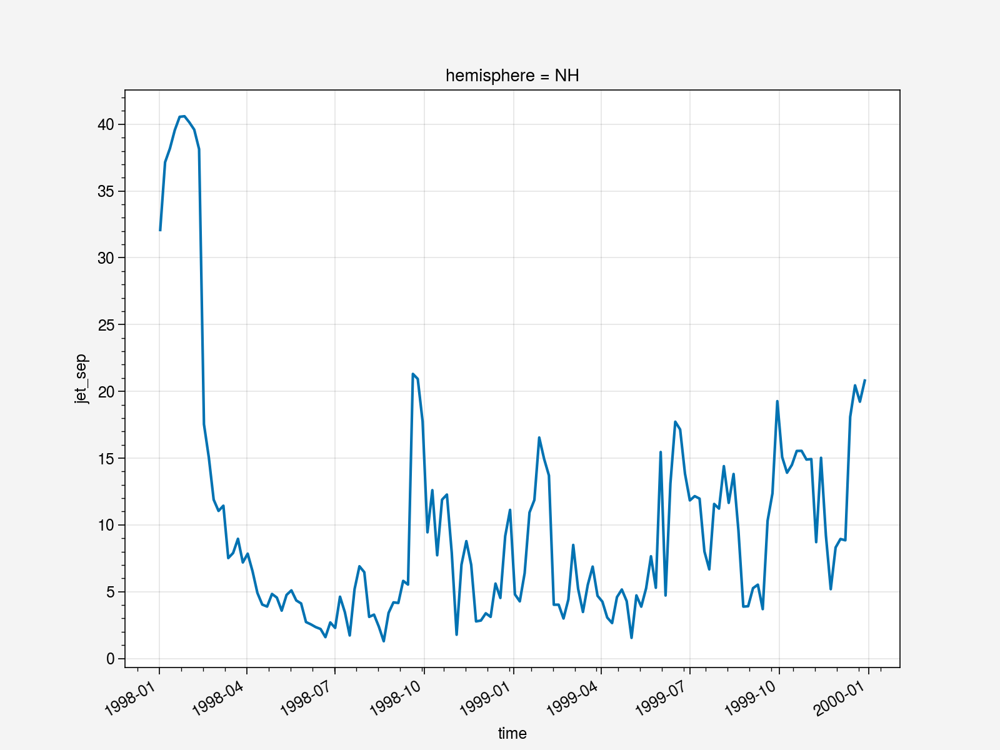

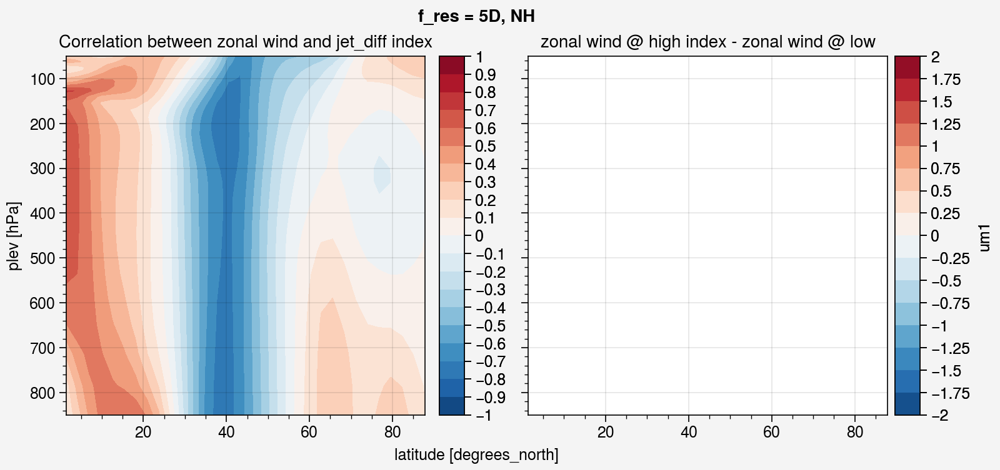

In [26]:
resample_freq = '5D'
hemisphere = 'NH'

ds_js = calc_jet_sep_index(ds_zm, resample_freq=resample_freq).sel(hemisphere=hemisphere)

ds_js.jet_sep.plot()

ds_res_full = ds_zm.resample(time=resample_freq).mean('time')
if hemisphere == 'NH':
    ds_res = ds_res_full.sel(lat=slice(90,0))
elif hemisphere == 'SH':
    ds_res = ds_res_full.sel(lat=slice(0,-90)) 
# Correlation maps

y = (ds_res.um1 - ds_res.um1.mean('time'))/ds_res.um1.std('time')
x = (ds_js.jet_sep - ds_js.jet_sep.mean('time'))/ds_js.jet_sep.std('time')

fig, ax = pplt.subplots(ncols=2,figwidth=8, suptitle=f'f_res = {resample_freq}, {hemisphere}')

corr_map = xr.corr(y, x, dim="time")
corr_map.plot.contourf(levels=np.arange(-1,1.001,0.1), ax=ax[0])

threshhold=1.0
time_high = x.time.where(x > threshhold, drop=True)
time_low = x.time.where(x < -threshhold, drop=True)

y = ds_res.um1
x = (ds_js.jet_sep - ds_js.jet_sep.mean('time'))/ds_js.jet_sep.std('time')

(y.sel(time=time_high).mean('time') - y.sel(time=time_low).mean('time')).plot.contourf(ax=ax[1], levels=np.arange(-2,2.1,0.25))

ax[0].set_title('Correlation between zonal wind and jet_diff index')
ax[1].set_title('zonal wind @ high index - zonal wind @ low')
for a in ax:
    a.set_ylim([850,50])
    
fig.savefig(f'{exp_name}_point_correlation_{resample_freq}_{hemisphere}.{plot_format}')

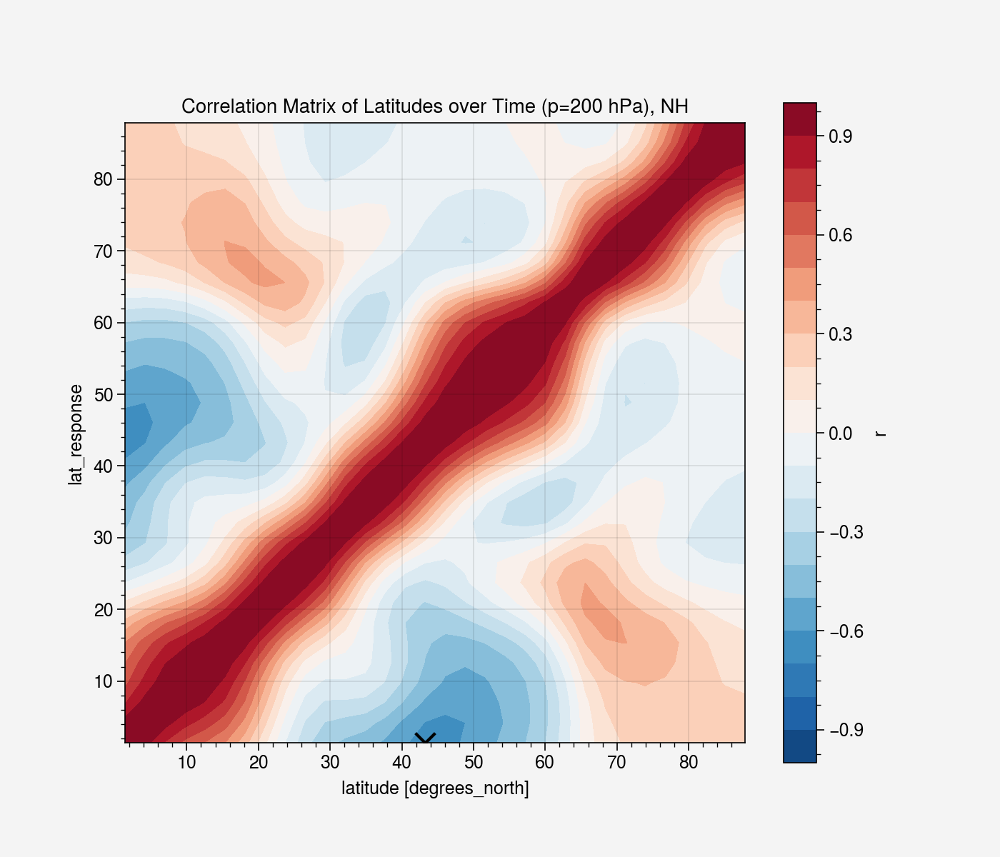

In [27]:
# Correlation maps

y = ds_res.um1
x = (ds_js.jet_sep - ds_js.jet_sep.mean('time'))/ds_js.jet_sep.std('time')

reference_p = 200

corr_mat_xr = (
    xr.apply_ufunc(
        np.corrcoef,
        y.sel(
            plev=reference_p, method='nearest'
        ),
        input_core_dims=[["time"]],
        output_core_dims=[["lat_response"]],
    )
    .assign_coords(lat_response=y.lat.values)
    .rename("r")
)

fig = plt.figure(figsize=(7, 6))
corr_mat_xr.T.plot.contourf(levels=np.arange(-1, 1.1, 0.1), extend="neither")
corr_min = corr_mat_xr.where(corr_mat_xr == corr_mat_xr.min(), drop=True)
plt.scatter(corr_min.lat, np.flipud(corr_min.lat_response), marker="x", c="k", s=100)
plt.gca().set_aspect("equal")
plt.title(f"Correlation Matrix of Latitudes over Time (p=200 hPa), {hemisphere}")
plt.show()
fig.savefig(f'{exp_name}_correlation_matrix_u_200hPa_{resample_freq}_{hemisphere}.{plot_format}')

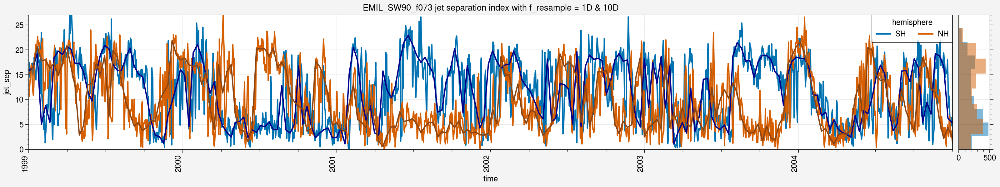

In [38]:
f_res_2 = '10D'
fig, ax = pplt.subplots(figsize=(16,3))
ds_js_2 = calc_jet_sep_index(ds_zm, resample_freq=f_res_2)
ds_js.jet_sep.plot.line(x='time')

ax.plot(ds_js_2.time, ds_js_2.jet_sep.sel(hemisphere='SH'), color='darkblue')
ax.plot(ds_js_2.time, ds_js_2.jet_sep.sel(hemisphere='NH'), color='saddlebrown')

ax.set_title(f'{exp_name} jet separation index with f_resample = {f_res} & {f_res_2}')
if 'trans_date' in ds_zm:
    trans_date = np.datetime_as_string(ds_zm.trans_date.values, unit='D')
    ax.set_title(f'{exp_name} jet separation index with f_resample = {f_res}, transition at {trans_date}')

ax.set_ylim([0,27])

p_right = ax.panel('right')

p_right.hist(ds_js.jet_sep.sel(hemisphere='NH'), orientation='horizontal', alpha=0.5)
p_right.hist(ds_js.jet_sep.sel(hemisphere='SH'), orientation='horizontal', alpha=0.5)


fig.savefig(f'{exp_name}_jet_separation_index_{f_res}_{f_res_2}.{plot_format}')

In [3]:
ds_mm = ds_zm.resample(time='10D').mean('time')
ds_mm_ref = ds_zm_ref.resample(time='10D').mean('time')

edj_lats = np.zeros((4, ds_mm_ref.time.size))
stj_lats = np.zeros((4, ds_mm_ref.time.size))

for i,time in enumerate(ds_mm_ref.time):
    ds_mm_sel = ds_mm.sel(time=time)
    ds_mm_ref_sel = ds_mm_ref.sel(time=time)
    
    edj_l, stj_l = calc_jet_lats_tropd(ds_mm_sel.um1)[:2]
    
    edj_lats[0,i] = np.mean(edj_l[0])
    stj_lats[0,i] = np.mean(stj_l[0])
    edj_lats[1,i] = np.mean(edj_l[1])
    stj_lats[1,i] = np.mean(stj_l[1])
    
    edj_l, stj_l = calc_jet_lats_tropd(ds_mm_ref_sel.um1)[:2]
    
    edj_lats[2,i] = np.mean(edj_l[0])
    stj_lats[2,i] = np.mean(stj_l[0])
    edj_lats[3,i] = np.mean(edj_l[1])
    stj_lats[3,i] = np.mean(stj_l[1])
    
jet_diff_nh = np.abs(edj_lats[0] - stj_lats[0])
jet_diff_sh = np.abs(edj_lats[1] - stj_lats[1])
jet_diff_ref_nh = np.abs(edj_lats[2] - stj_lats[2])
jet_diff_ref_sh = np.abs(edj_lats[3] - stj_lats[3])

plt.plot(jet_diff_nh, label=exp_name+'nh', color='navy')
plt.plot(jet_diff_sh, label=exp_name+'sh', color='teal')
plt.plot(jet_diff_ref_nh, label=ref_name+'nh', color='darkred')
plt.plot(jet_diff_ref_sh, label=ref_name+'sh', color='coral')
plt.legend()
plt.savefig(f'{exp_name}-{ref_name}_jet_variability.{plot_format}')

KeyError: numpy.datetime64('1999-08-01T00:00:00.000000000')